## Assignment 2 for EE5731 AY2023/2024 Semester 2
### Exploring Optical Flow Estimation from Dark Videos (100)

#### Background
Let us build upon our exploration over dark images and extend it towards the exploration of dark videos. Particularly, we explore the optical flow estimated from these dark videos.

#### Requirements
In this assignment, you are to complete several (sub)-tasks that explores 1) the estimation of optical flow in dark videos with Lucas-Kanade and Horn-Schunck algorithms; 2) the effects of image enhancement over the results of optical flow estimation; and 3) what information could be obtained via the optical flow estimated.

Before doing the project, please read the instructions carefully (failure to follow them may result in unnecessary penalty):

1. Implement your codes with the code block in jupyter notebook, you may add in however much code blocks you require. TODO code blocks are added as placeholders. **DO NOT** modify the instructional markdown blocks;
2. Make sure your codes **clean**, **easily readable** (add meaningful comments if needed, comments are **markable**);
3. Make sure that the **submitted notebooks have been run** and the **cell outputs are clearly visible**.
4. Write your answers in the given markdown cells (with [**Fill in xxxx**]), keep your answers clear and concise;
5. Your submission should be the exported PDF file of your jupyter notebook. It is easier for you to **"Export to HTML"** first, then **Print to PDF**. Please print your PDF strictly in **Portrait** mode. Name your PDF file to **"MATRICULATION NUMBER_YOUR NAME_CA2.pdf"**
6. Incorrect submission format will result in a **direct** 20 points (out of 100) deduction.
6. Do submit your project on [Canvas](https://canvas.nus.edu.sg/) before the deadline: **5:59 pm (SGT), 11 November, 2024**; 
7. Policy on late submission: the deadline is a strict one, so please prepare and plan early and carefully. Any late submission will be deducted 10 points (out of 100) for every 24 hours.
8. This is an individual project, do **NOT** share your solutions with others, we have zero tolerance for **plagiarism**.

#### Before the Task
- For the following task, you are to use [Walk.mp4](https://canvas.nus.edu.sg/files/5168966/download?download_frd=1) and [Run.mp4](https://canvas.nus.edu.sg/files/5168967/download?download_frd=1).
- **IMPORTANT!** You may use any function of OpenCV or its equivalence for basic operations (e.g., loading images, matrix computation, etc.), but **strictly NOT** the direct functions for each individual task/step (e.g., cv2.calcOpticalFlowPyrLK or its equivalence for Lucas-Kanade OF, and opticalFlowHS in MatLab for Horn-Schunck OF or its equivalence), **unless specified in the steps/instruction** . Using such functions without permission in that step/instruction would be considered erroneous. Other suggested opencv functions will be mentioned for some parts of the task. 

#### Task: Optical Flow Estimation for Ultra-dark Videos (100%)
In this task, you will estimate the optical flow in dark videos with Lucas-Kanade and Horn-Schunck algorithms (from scratch), and explore the effects of image enhancement over the results of optical flow estimation. You shall further analyze what information could be obtained via the optical flow estimated. You are to follow the following steps (requirements):

##### Detailed Steps/Requirements for the Task:
1. Estimate the optical flow of Walk.mp4 with both Lucas-Kanade and Horn-Schunck algorithms. Both algorithm must be implemented **from scratch**. You should plot out the optical flow estimated with respect to the key points (corner points). You may use the OpenCV function of cv.goodFeaturesToTrack() or the detectMinEigenFeatures function in MatLab to find the key points directly. You may set the **maximum number** of keypoints to be 10. Show your codes in detail with comment as well as your results. Compare the results of both algorithms and analyze their similarity and differences. (30%)
2. You may brighten up the video yourself (using any tool available to you such as those included in your media players) and observe the video. Discuss if the optical flow estimated in Step 1 matches to that you observed manually. If yes, what do you think contributes to the correct estimation, if not, analyze the possible reasons of the mismatch. (20%)
3. Now, implement any enhancement methods of your choice (please specify which enhancement you choose), and apply it to Walk.mp4. Note that the enhancement method should also be implemented from scratch (thus functions such as cv2.cv.equalizeHist is **NOT Allowed**). Show your results with 4 sampled frames. Then, re-estimate the optical flow of the enhanced video and show your results. Compare the results with what you obtained in Step 1 and analyze why the result has changed / not changed. (20%)
4. Further, estimate the optical flows (both Lucas-Kanade and Horn-Schunck) for Run.mp4 using your implemented code. Show your result and compare them with what you obtained in Step 1 from Walk.mp4. What can you obtain by observing the similarity and differences from the optical estimated from the two videos. Further conclude what kind of information can be obtained from estimating optical flow of videos. (20%)
5. Lastly, estimate the optical flow using OpenCV's function cv2.calcOpticalFlowPyrLK() directly on Walk.mp4. Show and compare the result with your implementation in Step 1. If there are discrepancies, analyze possible reasons of the discrepancies, if they are very similar, suggest what is the key to estimate rather accurate optical flow. (10%)

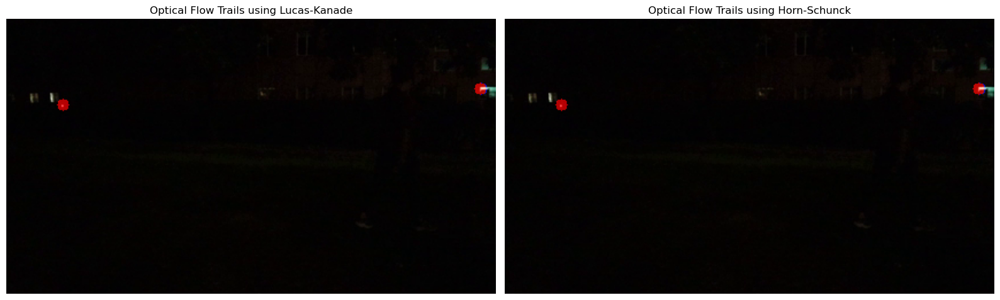

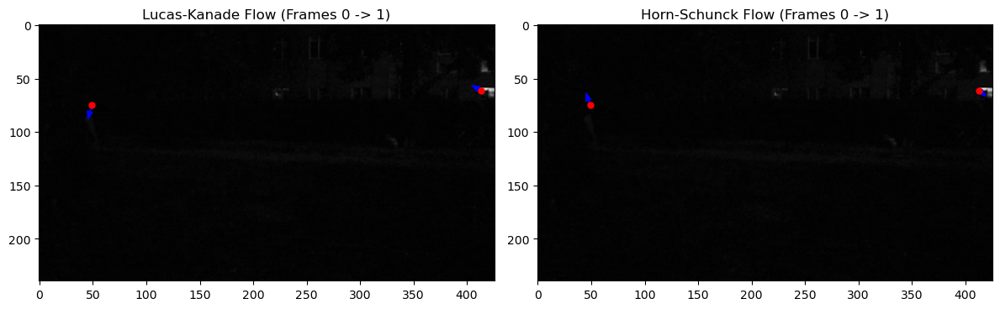

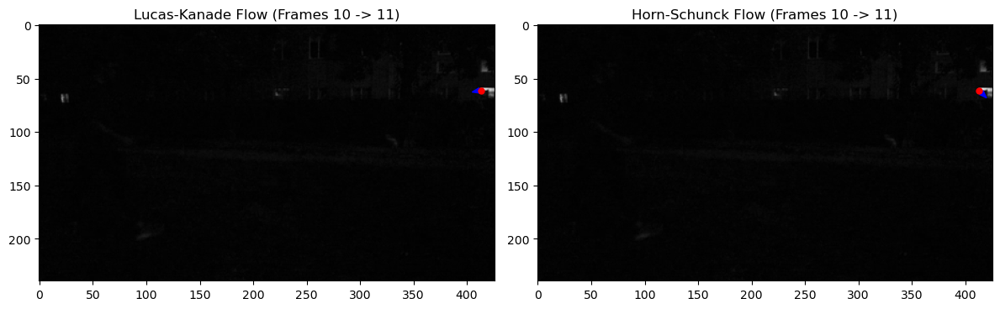

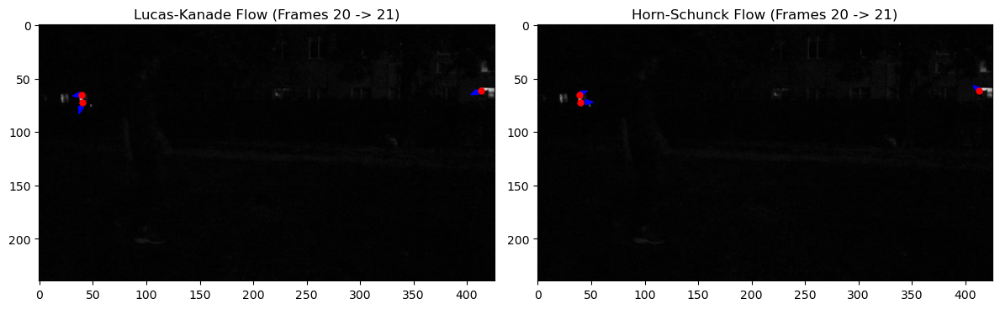

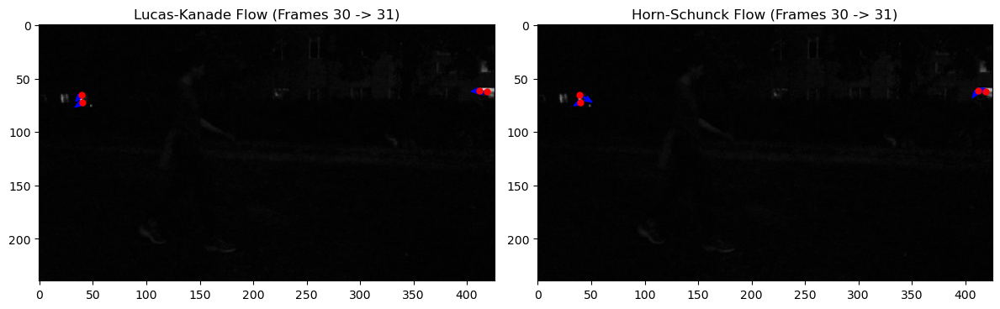

...

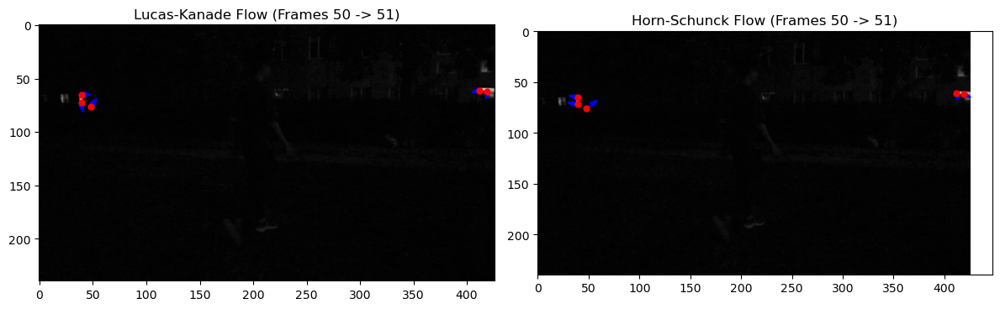

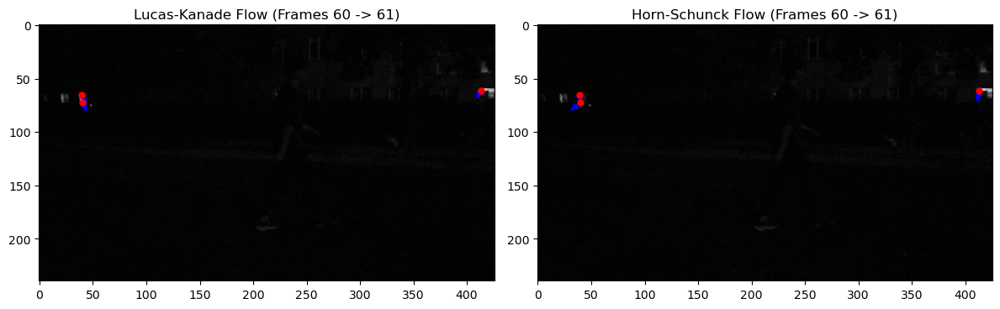

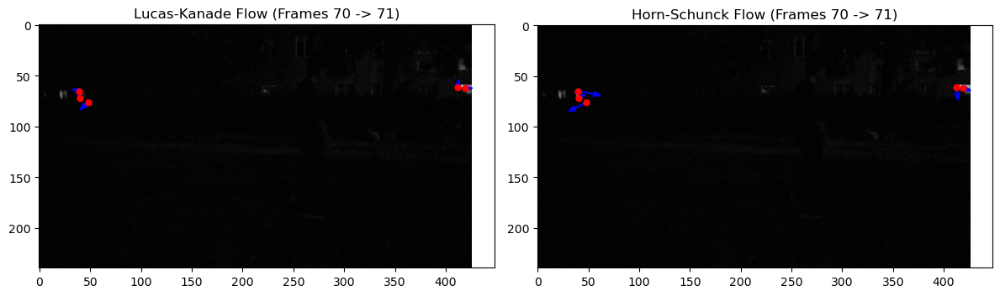

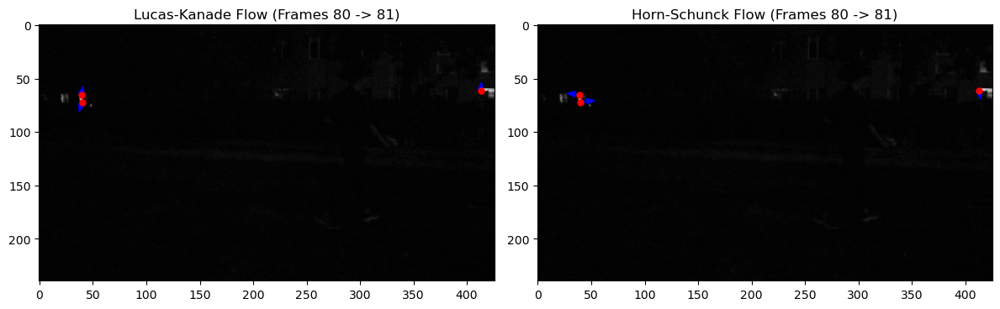

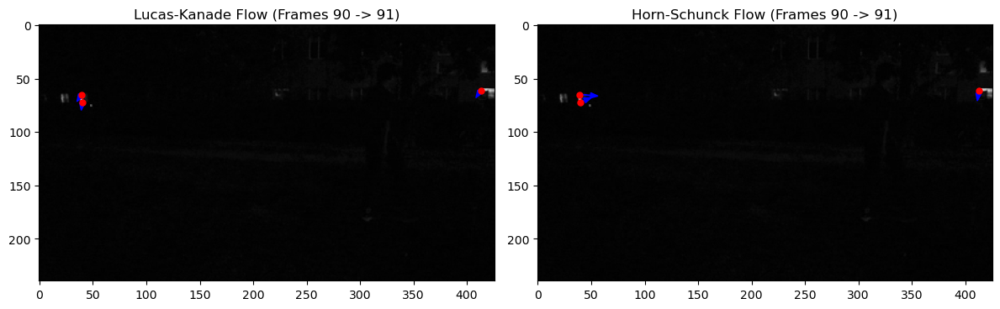

In [1]:
#############################################################################
##                                                                         ##
##           TODO: CODE BLOCK FOR STEP 1 IS HERE                           ##
#############################################################################
import cv2
import numpy as np
import matplotlib.pyplot as plt

def lucas_kanade_of(frame1, frame2, points, window_size=5, max_level=2):
    """
    Compute optical flow using Lucas-Kanade method with pyramid processing.

    Here we added pyramid processing to the original LK algorithm to make it more similar to OpenCV's implementation. 
    Adding pyramid processing can help to handle motion at different scales and improve the accuracy 
    of the optical flow estimation, which can be helpful in step 3 and 4.
    
    Args:
        frame1: First input frame (previous frame)
        frame2: Second input frame (current frame)
        points: List of points to track (Nx1x2 array)
        window_size: Size of the window for local motion estimation
        max_level: Maximum pyramid level
        
    Returns:
        next_pts: Calculated new positions of input points
        status: Status of points (1=found, 0=not found)
        err: Error for each point
    """
    if points is None or len(points) == 0:
        return None, None, None
        
    points = points.reshape(-1, 2)  # Convert to Nx2 array
    
    # Build image pyramids
    pyramid1 = [frame1.copy()]
    pyramid2 = [frame2.copy()]
    
    for level in range(max_level):
        pyramid1.append(cv2.pyrDown(pyramid1[-1]))
        pyramid2.append(cv2.pyrDown(pyramid2[-1]))
    
    # Initialize output arrays
    next_pts = points.copy()
    status = np.ones(len(points), dtype=np.uint8)
    err = np.zeros(len(points), dtype=np.float32)
    
    # Process from coarse to fine
    for level in range(max_level-1, -1, -1):
        scale = 1.0 / (2.0 ** level)
        
        # Scale points to current level
        level_points = next_pts * scale
        
        # Calculate gradients at this level
        Ix = cv2.Sobel(pyramid1[level], cv2.CV_64F, 1, 0, ksize=5)
        Iy = cv2.Sobel(pyramid1[level], cv2.CV_64F, 0, 1, ksize=5)
        It = pyramid2[level].astype(np.float64) - pyramid1[level].astype(np.float64)
        
        half_window = window_size // 2
        level_flow = []
        
        for i, point in enumerate(level_points):
            if not status[i]:
                level_flow.append([0, 0])
                continue
                
            x, y = int(round(point[0])), int(round(point[1]))
            
            # Check boundaries
            if (x < half_window or y < half_window or 
                x >= (pyramid1[level].shape[1] - half_window) or 
                y >= (pyramid1[level].shape[0] - half_window)):
                status[i] = 0
                level_flow.append([0, 0])
                continue
            
            # Extract windows
            Ix_win = Ix[y-half_window:y+half_window+1, 
                       x-half_window:x+half_window+1].flatten()
            Iy_win = Iy[y-half_window:y+half_window+1, 
                       x-half_window:x+half_window+1].flatten()
            It_win = It[y-half_window:y+half_window+1, 
                       x-half_window:x+half_window+1].flatten()
            
            # Construct system of equations
            A = np.vstack((Ix_win, Iy_win)).T
            b = -It_win
            
            # Solve optical flow equation
            if np.linalg.det(A.T @ A) > 1e-6:  # Check if system is well-conditioned
                flow = np.linalg.solve(A.T @ A, A.T @ b)
                err[i] = np.linalg.norm(A @ flow + b)  # Calculate error
                level_flow.append(flow)
            else:
                status[i] = 0
                level_flow.append([0, 0])
        
        # Update points for next level
        level_flow = np.array(level_flow)
        next_pts = level_points + level_flow
        next_pts = next_pts / scale  # Scale back to original size
    
    # Reshape output to match OpenCV format
    next_pts = next_pts.reshape(-1, 1, 2)
    status = status.reshape(-1, 1)
    err = err.reshape(-1, 1)
    
    return next_pts, status, err


def horn_schunck_of(frame1, frame2, alpha=0.1, iterations=200):
    """
    Implement Horn-Schunck optical flow estimation
    """
    # Convert frames to float32
    I1 = frame1.astype(np.float32)
    I2 = frame2.astype(np.float32)
    
    # Calculate spatial and temporal gradients
    Ix = cv2.Sobel(I1, cv2.CV_32F, 1, 0, ksize=5)
    Iy = cv2.Sobel(I1, cv2.CV_32F, 0, 1, ksize=5)
    It = I2 - I1
    
    # Initialize flow vectors
    u = np.zeros_like(I1)
    v = np.zeros_like(I1)
    
    # Iterate to minimize the energy function
    for _ in range(iterations):
        # Calculate the average of the flow
        u_avg = cv2.blur(u, (3,3))
        v_avg = cv2.blur(v, (3,3))
        
        # Update the flow estimation
        den = Ix**2 + Iy**2 + alpha**2
        num = Ix * u_avg + Iy * v_avg + It
        u = u_avg - Ix * num / den
        v = v_avg - Iy * num / den
    
    return u, v


def process_video(video_path, frame_step=10, max_keypoints=10, window_size=25, total_pairs=10, scale=100):
    """
    Process video, calculate and plot the optical flow for every frame_step frames
    """
    cap = cv2.VideoCapture(video_path)
    
    if not cap.isOpened():
        print("Error: Cannot open video file.")
        return
    
    frame_idx = 0
    pair_count = 0
    
    while pair_count < total_pairs:
        # Read the first frame
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
        ret, old_frame = cap.read()
        if not ret:
            break
            
        old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
        
        # Detect keypoints
        points = cv2.goodFeaturesToTrack(old_gray, 
                                       maxCorners=max_keypoints, 
                                       qualityLevel=0.3, 
                                       minDistance=7)
        if points is None:
            frame_idx += frame_step
            continue
            
        points = points.reshape(-1, 2)
        
        # read the next frame
        next_frame_idx = frame_idx + 1
        cap.set(cv2.CAP_PROP_POS_FRAMES, next_frame_idx)
        ret, frame = cap.read()
        if not ret:
            break
            
        frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        
        # Calculate optical flow
        new_points_lk, status_lk, _ = lucas_kanade_of(old_gray, frame_gray, points, window_size)
        hs_u, hs_v = horn_schunck_of(old_gray, frame_gray)
        
        if new_points_lk is None:
            frame_idx += frame_step
            continue
            
        # Extract the flow vectors
        lk_flow = new_points_lk.reshape(-1, 2) - points
        
        # Extract the flow at the keypoint locations for HS
        hs_flow = np.array([[hs_u[int(p[1]), int(p[0])], 
                            hs_v[int(p[1]), int(p[0])]] for p in points])
        
        # Check for invalid values
        lk_flow = np.nan_to_num(lk_flow, nan=0.0, posinf=0.0, neginf=0.0)
        hs_flow = np.nan_to_num(hs_flow, nan=0.0, posinf=0.0, neginf=0.0)
        
        # Create images
        plt.figure(figsize=(12, 6))
        
        # Lucas-Kanade
        plt.subplot(1, 2, 1)
        plt.imshow(old_gray, cmap='gray')
        plt.title(f'Lucas-Kanade Flow (Frames {frame_idx} -> {next_frame_idx})')
        
        # Plot the flow vectors at each keypoint
        for i, (point, flow) in enumerate(zip(points, lk_flow)):
            if status_lk[i]:  # only plot if point was successfully tracked
                plt.plot(point[0], point[1], 'ro', markersize=5)
                plt.arrow(point[0], point[1], 
                         flow[0]*scale, flow[1]*scale,  # scale factor
                         color='blue',
                         width=0.5,        
                         head_width=5,     
                         head_length=7,    
                         alpha=1)        
            
        plt.axis('on')
        
        # Horn-Schunck
        plt.subplot(1, 2, 2)
        plt.imshow(old_gray, cmap='gray')
        plt.title(f'Horn-Schunck Flow (Frames {frame_idx} -> {next_frame_idx})')
        
        # Plot the flow vectors at each keypoint
        for i, (point, flow) in enumerate(zip(points, hs_flow)):
            plt.plot(point[0], point[1], 'ro', markersize=5)
            plt.arrow(point[0], point[1], 
                     flow[0]*scale, flow[1]*scale,  # scale factor
                     color='blue',
                     width=0.5,        
                     head_width=5,     
                     head_length=7,    
                     alpha=1)        
            
        plt.axis('on')
        
        plt.tight_layout()
        plt.show()
        
        frame_idx = frame_idx + frame_step
        pair_count += 1
    
    cap.release()

def plot_optical_flow_trails(video_path, window_size=21, max_keypoints=10):
    """
    Use custom LK and HS algorithms to estimate optical flow, display the final result
    """
    cap = cv2.VideoCapture(video_path)
    
    # read the first frame
    ret, old_frame = cap.read()
    if not ret:
        print("Failed to read video")
        return
    
    old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
    
    # mask for drawing trails
    mask_lk = np.zeros_like(old_frame)
    mask_hs = np.zeros_like(old_frame)
    
    # detect initial keypoints
    p0 = cv2.goodFeaturesToTrack(old_gray, 
                                maxCorners=max_keypoints,
                                qualityLevel=0.3,
                                minDistance=7)
    if p0 is None:
        print("No features found")
        return
    
    points = p0.reshape(-1, 2)
    initial_points = points.copy()  # save initial point locations
    final_frame = None
    
    while True:
        ret, frame = cap.read()
        if not ret:
            break
            
        final_frame = frame.copy()
        frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # use LK algorithm to calculate optical flow
        new_points_lk, status_lk, _ = lucas_kanade_of(old_gray, frame_gray, points, window_size)
        
        if new_points_lk is not None:
            new_points_lk = new_points_lk.reshape(-1, 2)  # reshape to 2D array
            status_lk = status_lk.reshape(-1)
        else:
            continue

        # use HS algorithm to calculate optical flow
        hs_u, hs_v = horn_schunck_of(old_gray, frame_gray)
        hs_flow = np.array([[hs_u[int(p[1]), int(p[0])], 
                            hs_v[int(p[1]), int(p[0])]] for p in points])
        new_points_hs = points + hs_flow
        
        # draw trails
        for i, (old, new_lk, new_hs) in enumerate(zip(points, new_points_lk, new_points_hs)):
            if status_lk[i]:  # only draw if point was successfully tracked
                # LK trail
                pt1 = (int(old[0]), int(old[1]))
                pt2 = (int(new_lk[0]), int(new_lk[1]))
                cv2.line(mask_lk, pt1, pt2, (0, 255, 0), 2)  
                
                # HS trail
                pt2_hs = (int(new_hs[0]), int(new_hs[1]))
                cv2.line(mask_hs, pt1, pt2_hs, (0, 0, 255), 2)  
        
        # update points and frame
        points = new_points_lk  # use LK results to continue tracking
        old_gray = frame_gray.copy()
    
    # mark the starting and ending points on the final result
    for point in initial_points:
        cv2.circle(mask_lk, (int(point[0]), int(point[1])), 5, (255, 0, 0), -1)  
        cv2.circle(mask_hs, (int(point[0]), int(point[1])), 5, (255, 0, 0), -1)
    
    for point in points:
        cv2.circle(mask_lk, (int(point[0]), int(point[1])), 5, (0, 0, 255), -1)  
        cv2.circle(mask_hs, (int(point[0]), int(point[1])), 5, (0, 0, 255), -1)
    
    # merge trails and final frame
    result_lk = cv2.addWeighted(final_frame, 1, mask_lk, 0.7, 0)
    result_hs = cv2.addWeighted(final_frame, 1, mask_hs, 0.7, 0)
    
    # display the final result
    plt.figure(figsize=(16, 8))
    
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(result_lk, cv2.COLOR_BGR2RGB))
    plt.title('Optical Flow Trails using Lucas-Kanade')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(result_hs, cv2.COLOR_BGR2RGB))
    plt.title('Optical Flow Trails using Horn-Schunck')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    cap.release()
#operations
plot_optical_flow_trails('Walk.mp4', max_keypoints=10, window_size=5)

process_video('Walk.mp4', frame_step=10, max_keypoints=10, window_size=5, total_pairs=10, scale = 3000)



[**Fill in your discussion to Step 1 here**]

In step 1, both Lucas-Kanade and Horn-Schunck algorithms are implemented, and two ways are used to plot the optical flow: 
1. Plot the optical flow trails on the original video.
2. Plot the optical vectors obtained from every 10 frames.

It can be observed that both alforithms **cannot** detect the motion of the person in the video.

*Similarity*:

1. Both algorithms can estimate the optical flow(vectors) from the video, but the obtained optical flow **cannot accurately match the actual motion of the person**(as we can see in step2), most keypoints selected are on the upper left and upper right of the frames (seems to be the windows).
2. In different frames, most of the optical flow vectors of same keypoints obtained by 2 algorithms are in same direction.
3. The optical flow trails obtained by 2 algorithms looks the same, but **cannot show the actual motion**.

*Differences*:

1. As the length of the optical flow vectors represent the magnitude of the motion, and the vectors are plot under the same scale, it can be observed that the vectors obtained by LK algorithm are shorter than those obtained by HS algorithm, suggesting that the LK algorithm detect a smaller motion.
2. In some frames, the direction of optical flow detected by two algorithms are different.

*Discussion*:

1. The keyopints selected are not on the person itself.
2. Since the camera is not fixed, we can obtained the optical flow, but the flow cannot represent the person's motion.
3. In dark conditions, the HS algorithm failed to generate a dense flow field beacuse the smoothness assumption fails with insufficient contrast and the limited intensity gradient between frames make motion detection difficult. Low-light condition also introduces noise.
4. Possible solution is to brighten up the video or enhance it in other ways and try different algotithms.


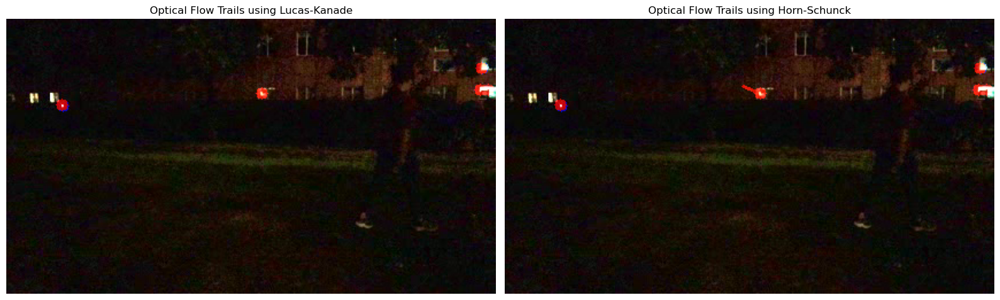

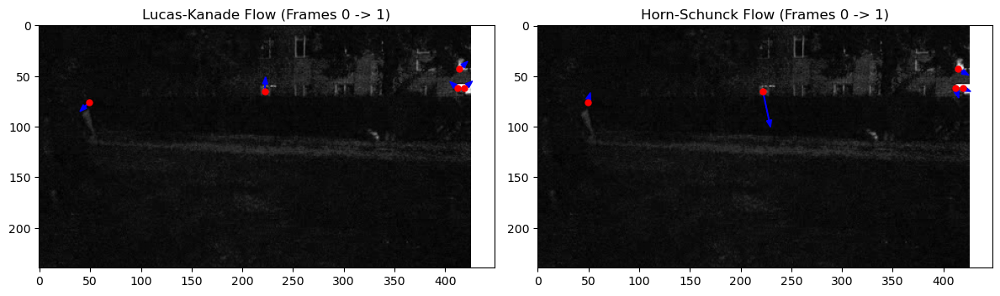

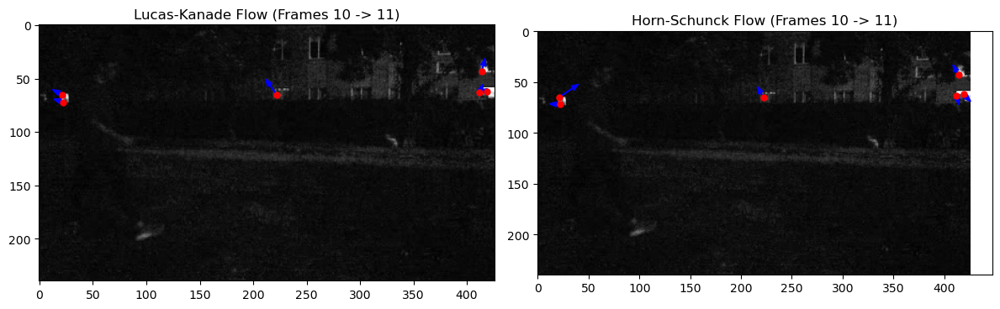

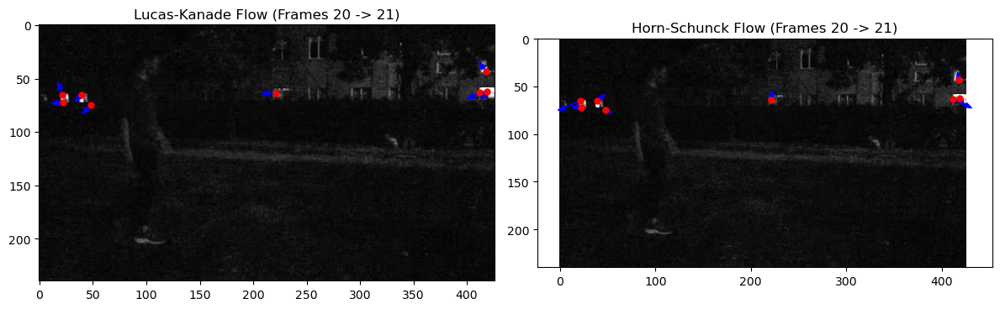

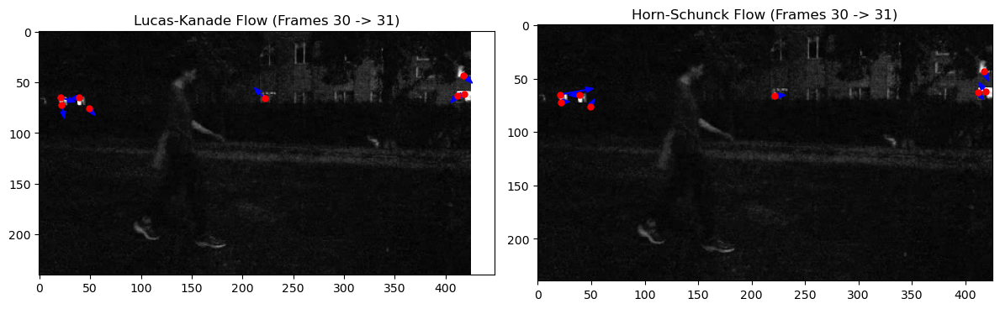

...

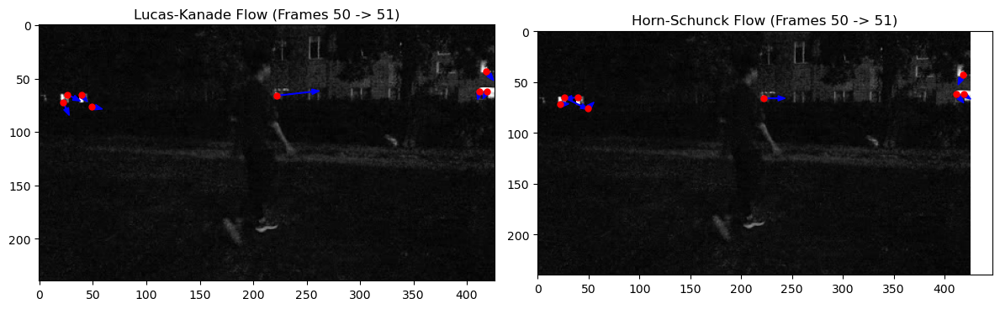

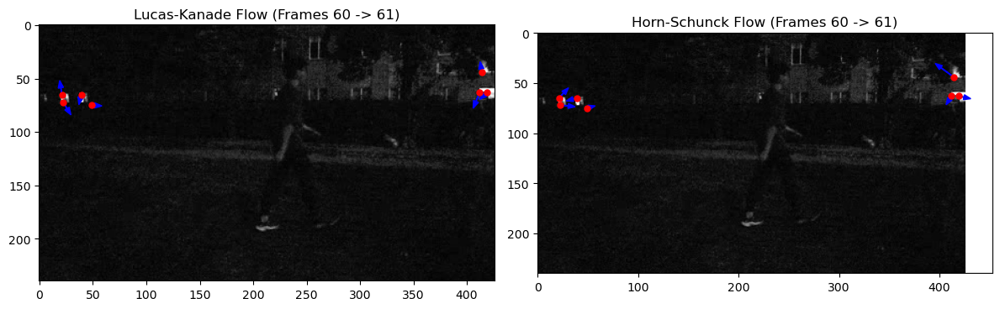

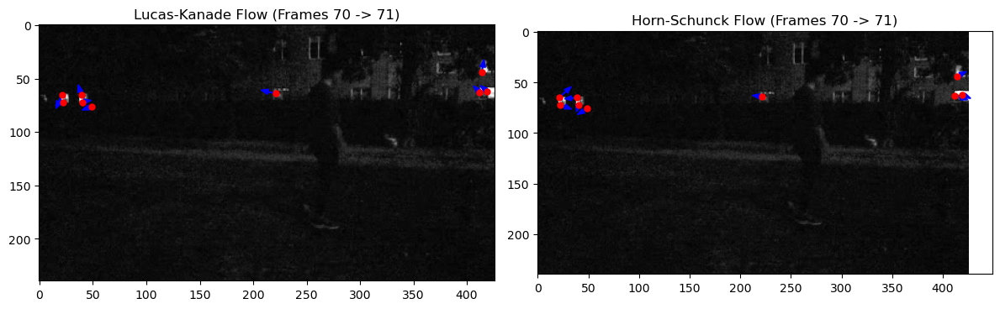

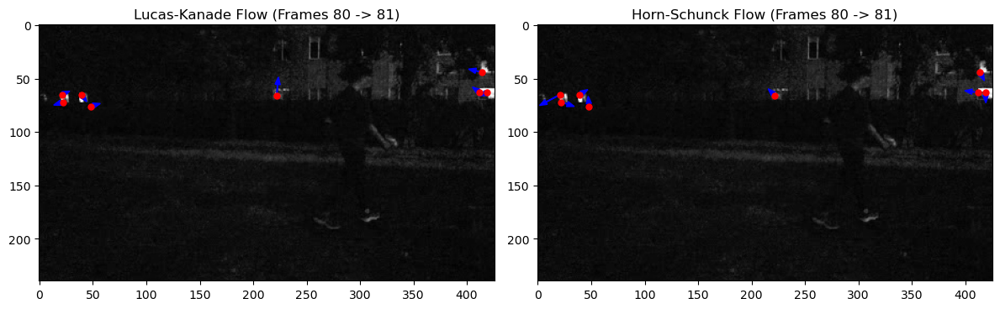

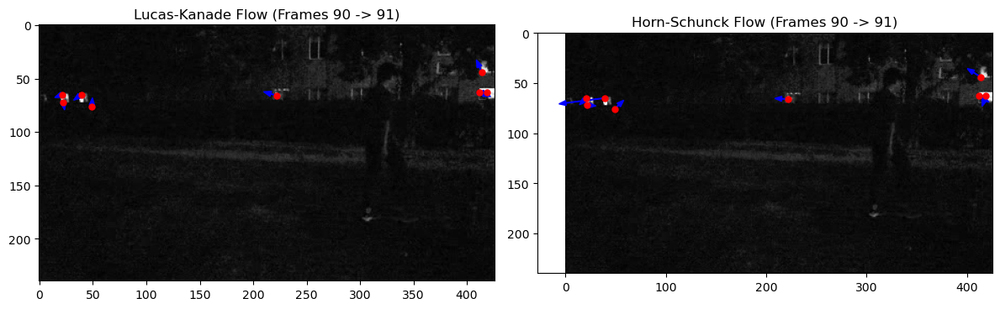

In [2]:
#############################################################################
##                                                                         ##
##           TODO: CODE BLOCK FOR STEP 2 IS HERE                           ##
#############################################################################

#Here we run the same code on the brightened video

plot_optical_flow_trails('Walk_brightened.mp4', max_keypoints=10, window_size=5)

process_video('Walk_brightened.mp4', frame_step=10, max_keypoints=10, window_size=5, total_pairs=10, scale = 3000)


[**Fill in your discussion to Step 2 here**]

The brightened up video is saved as Walk_brightened.mp4. From the brighteded video, we can observe a person walking from left side to the right side. The optical flow estimated from step 1 **doesn't accurately match the actual motion** of the person in the video. 

*Possible reasons for the mismatch:*
1. **Keypoints selected**: the keypoints selected by cv.goodFeaturesToTrack() are not on the person itself. The keypoints are mainly around brighter spots, like the windows on two sides, only a few of them are on the person. The limited keypoints on person cannot show the actual motion.
2. **Low light condition**: In dark conditions, the result of gradient calculation is unreliable. Both LK and HS algorithms rely heavily on gradient calculations, this can also cause the mismatch.
3. **Brightness constancy assumption**: Both algorithms are built on brightness constancy assumption. In ultra dark conditions, this assumption might be violated.
4. **Smoothness assumption**: A smooth, continuous flow across the entire image is assumed in HS algorithm. In dark conditions, this assumption can fail with weak gradients.

As shown in the result of the above code block, I also obtained the optical flow trails and vectors on the brightened video. It can be observed that more keypoints are detected in the brightened video. However, the flow trails result are still mismatch with the actual motion, this suggests that we may need some other ways to enhance the video for better optical flow estimation. We can also try other ways to detect the keypoints to avoid the impact of the windows (wrong keypoints).


Video saved to Walk_enhanced_clahe.mp4


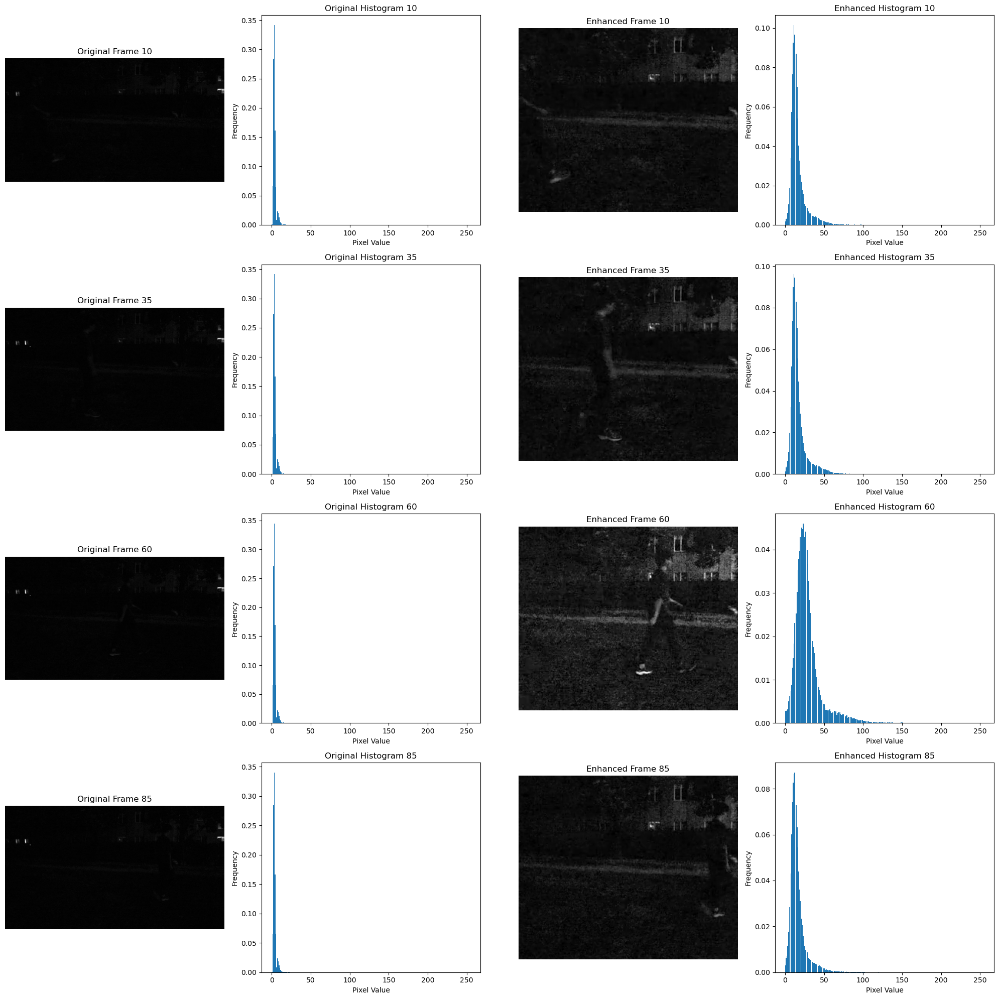

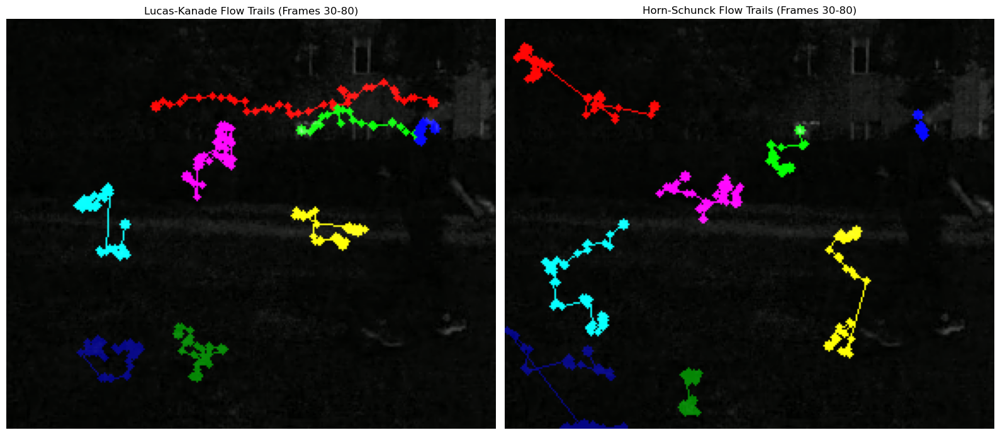

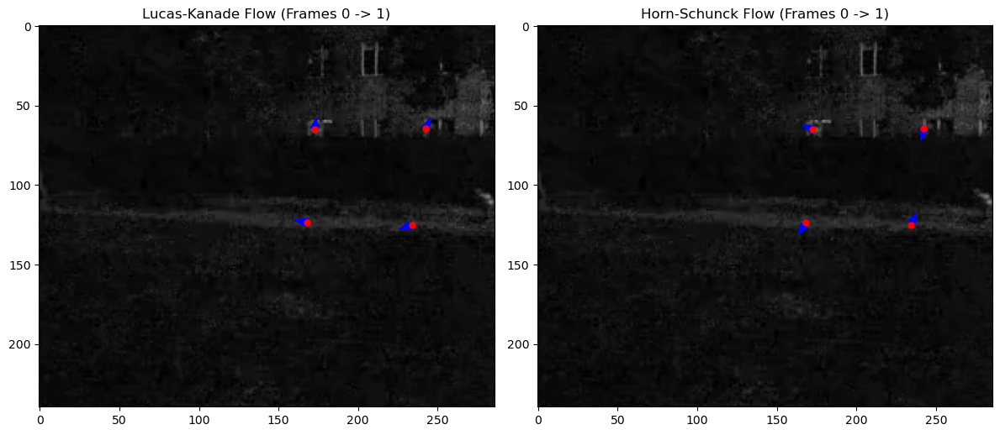

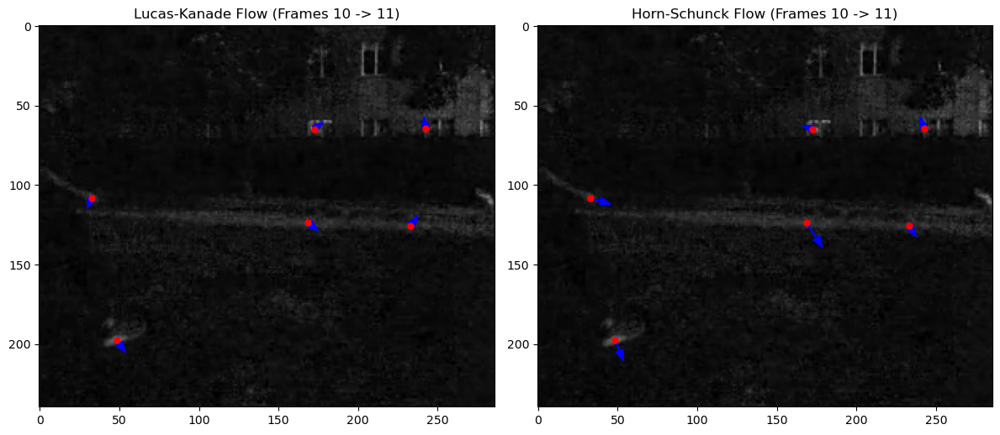

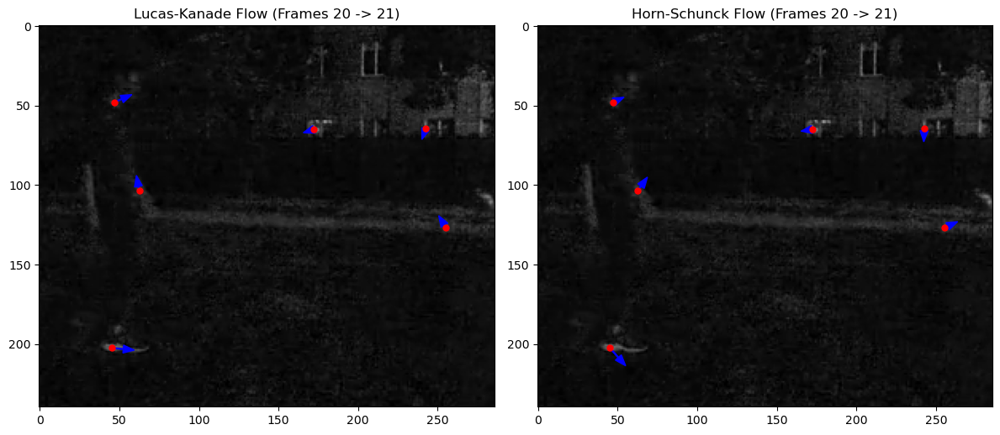

...

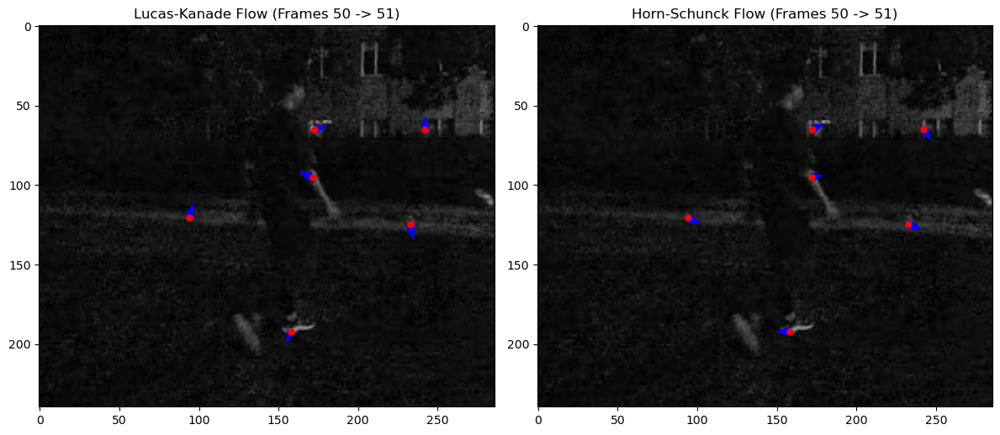

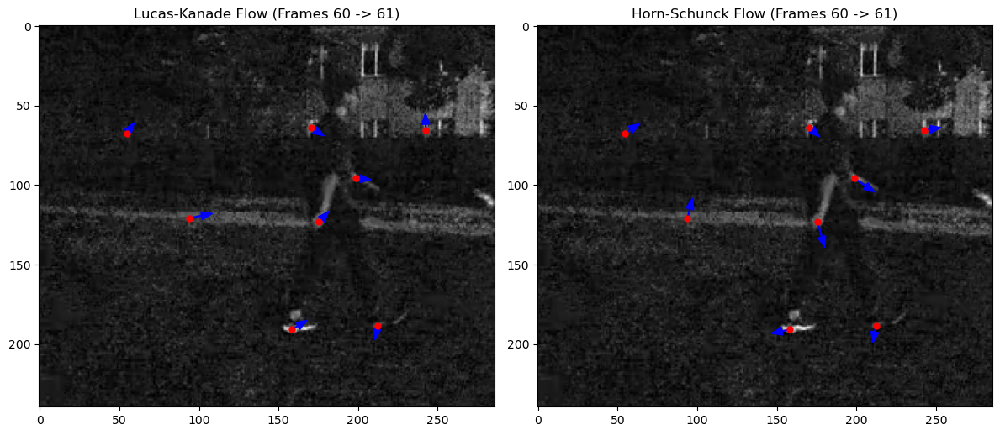

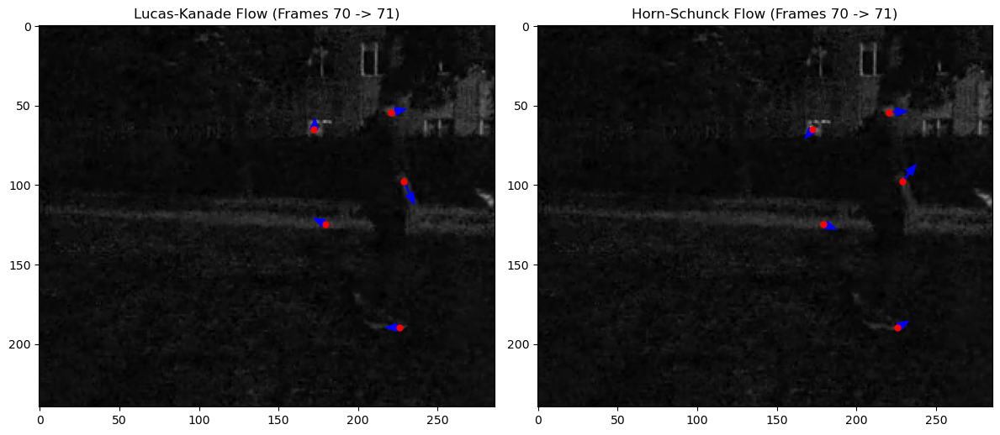

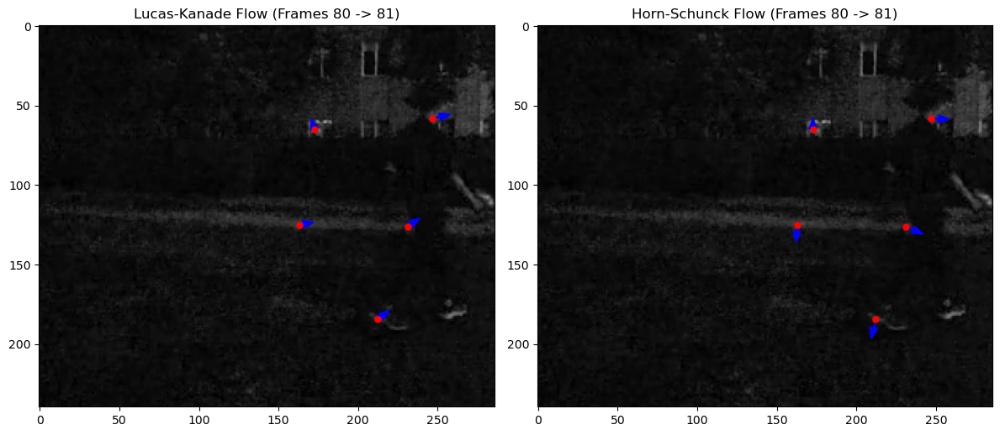

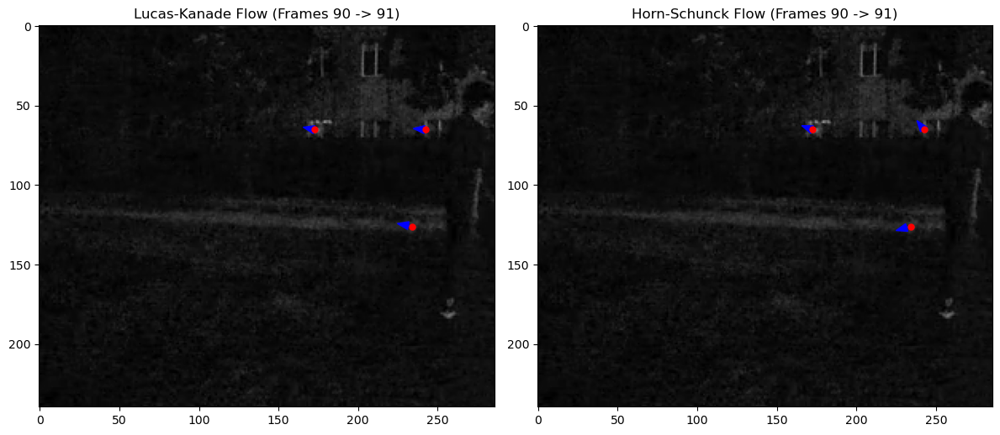

In [3]:
#############################################################################
##                                                                         ##
##           TODO: CODE BLOCK FOR STEP 3 IS HERE                           ##
#############################################################################
"""
For Step 3, it mainly contains 3 parts:
1. Enhance the video using CLAHE
2. Plot sample frames of the enhanced video
3. Use the enhanced video to plot the optical flows
"""

"""
Step 3.1: Enhance the video
Here I implement Contrast Limited Adaptive Histogram Equalization (CLAHE) to enhance the video.
As discussed in step2, we found that most keypoints selected are on the windows on two sides. To avoid this, 
we can manually crop the frames of the video so that more keypoints selected can be on the moving person.
"""
def clahe_enhance(image, clip_limit=2.5, grid_size=(10, 10)):
    """
    Custom implementation of Contrast Limited Adaptive Histogram Equalization
    
    Args:
        image: Input image (can be color or grayscale)
        clip_limit: Threshold for contrast limiting
        grid_size: Size of grid for histogram equalization
    
    Returns:
        enhanced_image: Enhanced image after CLAHE
        crop_left: Number of pixels cropped from left
        crop_right: Number of pixels cropped from right
    """
    # Convert to grayscale if color image
    if len(image.shape) == 3:
        img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        img_gray = image.copy()
    
    h, w = img_gray.shape
    
    # Crop image to remove windows on sides
    crop_left = 50
    crop_right = 90
    img_gray = img_gray[:, crop_left:w-crop_right]
    h, w = img_gray.shape
    enhanced_image = np.zeros_like(img_gray, dtype=np.float32)

    # Calculate tile dimensions
    tile_h = int(np.ceil(h / grid_size[0]))
    tile_w = int(np.ceil(w / grid_size[1]))

    # Process each tile
    for i in range(grid_size[0]):
        for j in range(grid_size[1]):
            y_start = tile_h * i
            y_end = min(tile_h * (i + 1), h)
            x_start = tile_w * j
            x_end = min(tile_w * (j + 1), w)

            tile = img_gray[y_start:y_end, x_start:x_end]

            # Apply CLAHE to tile
            hist, _ = np.histogram(tile.flatten(), 256, [0, 256])
            excess = np.maximum(0, hist - clip_limit)
            redistributed = excess.sum() / 256.0
            hist = np.minimum(clip_limit, hist) + redistributed

            # Calculate CDF and normalize
            cdf = hist.cumsum()
            cdf = (cdf * 255) / cdf[-1]
            cdf = cdf.astype('uint8')

            # Map values
            enhanced_tile = cdf[tile]
            enhanced_image[y_start:y_end, x_start:x_end] = enhanced_tile

    # Normalize enhanced image
    enhanced_image = ((enhanced_image - np.min(enhanced_image)) / 
                     (np.max(enhanced_image) - np.min(enhanced_image)) * 255)
    
    return enhanced_image.astype('uint8'), crop_left, crop_right


def enhance_video_clahe(input_path, output_path):
    """
    Enhance video using pervious defined CLAHE and save results
    """
    cap = cv2.VideoCapture(input_path)
    
    # Read first frame to get cropped dimensions
    ret, first_frame = cap.read()
    if not ret:
        print("Error: Could not read video")
        return None
        
    # Get cropped frame dimensions
    enhanced_frame, crop_left, crop_right = clahe_enhance(first_frame)
    if len(enhanced_frame.shape) == 2:
        enhanced_frame = cv2.cvtColor(enhanced_frame, cv2.COLOR_GRAY2BGR)
    
    # Use cropped dimensions for output video
    frame_height, frame_width = enhanced_frame.shape[:2]
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    
    # Create video writer
    if cv2.VideoWriter_fourcc(*'avc1') is not None:
        fourcc = cv2.VideoWriter_fourcc(*'avc1')
    else:
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        
    out = cv2.VideoWriter(
        output_path, 
        fourcc, 
        fps, 
        (frame_width, frame_height), 
        isColor=True
    )
    
    if not out.isOpened():
        print("Error: Could not open video writer")
        return None
    
    # Process first frame
    out.write(enhanced_frame)
    
    # Process remaining frames
    while True:
        ret, frame = cap.read()
        if not ret:
            break
            
        # Apply CLAHE enhancement with cropping
        enhanced_frame, _, _ = clahe_enhance(frame)
        
        # Convert back to BGR for video writing
        if len(enhanced_frame.shape) == 2:
            enhanced_frame = cv2.cvtColor(enhanced_frame, cv2.COLOR_GRAY2BGR)
        
        # Write frame (no resize needed as we're using cropped dimensions)
        out.write(enhanced_frame)
    
    # Release resources
    cap.release()
    out.release()
    cv2.destroyAllWindows()
    
    print(f"Video saved to {output_path}")
    return output_path


"""
Step 3.2: Plot sample frames of the enhanced video
"""
# Plot sample frames of the enhanced video
def plot_sample_frames(original_video_path, enhanced_video_path, frames=[10, 35, 60, 85]):
    """
    Plot sample frames from original and enhanced videos with their histograms
    """
    # Load videos
    cap_orig = cv2.VideoCapture(original_video_path)
    cap_enh = cv2.VideoCapture(enhanced_video_path)
    
    # Set up plot
    fig = plt.figure(figsize=(20, 5*len(frames)))
    
    for idx, frame_num in enumerate(frames):
        # Set frame position for both videos
        cap_orig.set(cv2.CAP_PROP_POS_FRAMES, frame_num)
        cap_enh.set(cv2.CAP_PROP_POS_FRAMES, frame_num)
        
        # Read frames
        ret_orig, frame_orig = cap_orig.read()
        ret_enh, frame_enh = cap_enh.read()
        
        if not ret_orig or not ret_enh:
            print(f"Could not read frame {frame_num}")
            continue
            
        # Convert to grayscale
        frame_orig_gray = cv2.cvtColor(frame_orig, cv2.COLOR_BGR2GRAY)
        frame_enh_gray = cv2.cvtColor(frame_enh, cv2.COLOR_BGR2GRAY)
        
        # Original frame
        plt.subplot(len(frames), 4, idx*4 + 1)
        plt.imshow(frame_orig_gray, cmap='gray')
        plt.title(f'Original Frame {frame_num}')
        plt.axis('off')
        
        # Original histogram
        plt.subplot(len(frames), 4, idx*4 + 2)
        plt.hist(frame_orig_gray.ravel(), bins=256, range=[0,255], density=True)
        plt.title(f'Original Histogram {frame_num}')
        plt.xlabel('Pixel Value')
        plt.ylabel('Frequency')
        
        # Enhanced frame
        plt.subplot(len(frames), 4, idx*4 + 3)
        plt.imshow(frame_enh_gray, cmap='gray')
        plt.title(f'Enhanced Frame {frame_num}')
        plt.axis('off')
        
        # Enhanced histogram
        plt.subplot(len(frames), 4, idx*4 + 4)
        plt.hist(frame_enh_gray.ravel(), bins=256, range=[0,255], density=True)
        plt.title(f'Enhanced Histogram {frame_num}')
        plt.xlabel('Pixel Value')
        plt.ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()
    
    # Release video captures
    cap_orig.release()
    cap_enh.release()



"""
Step 3.3: Use the enhanced video to plot the optical flows
Here we found that cv2.goodFeaturesToTrack() cannot detect keypoints we want(on the person itself), so we 
implement a custom keypoint detection function using FAST detector and grid-based selection.
Based on this, we defined a new process_video function to plot the optical flow vectors.
"""
def detect_keypoints_akaze(frame, max_points=10):
    """
    use AKAZE to detect keypoints
    
    Args:
        frame: input frame
        max_points: maximum number of keypoints
    """
    # convert to grayscale
    if len(frame.shape) == 3:
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    else:
        gray = frame.copy()
    
    # create AKAZE detector
    akaze = cv2.AKAZE_create(
        descriptor_type=cv2.AKAZE_DESCRIPTOR_MLDB,  # use MLDB descriptor
        descriptor_size=0,                          # descriptor size, 0 means auto
        descriptor_channels=3,                      # number of descriptor channels
        threshold=0.0004,                           # detection threshold
        nOctaves=4,                                # number of pyramid layers
        nOctaveLayers=4,                           # number of sublayers per layer
        diffusivity=cv2.KAZE_DIFF_PM_G2            # nonlinear diffusion method
    )
    
    # detect keypoints
    keypoints = akaze.detect(gray, None)
    
    if not keypoints:
        return None
    
    # sort keypoints by response value
    keypoints = sorted(keypoints, key=lambda x: x.response, reverse=True)
    
    # divide the image into 3x3 grid
    h, w = gray.shape
    cell_h, cell_w = h // 3, w // 3
    grid_points = {(i, j): [] for i in range(3) for j in range(3)}
    
    # assign keypoints to grid
    for kp in keypoints:
        x, y = kp.pt
        grid_x = int(x // cell_w)
        grid_y = int(y // cell_h)
        if grid_x < 3 and grid_y < 3:  # ensure in valid range
            grid_points[(grid_y, grid_x)].append(kp)
    
    # select points from each grid
    selected_points = []
    points_per_cell = max(1, max_points // 9)  # at least 1 point per grid
    
    for cell_points in grid_points.values():
        if cell_points:
            # select the top n_points points from each grid
            n_points = min(len(cell_points), points_per_cell)
            cell_points = sorted(cell_points, key=lambda x: x.response, reverse=True)
            selected_points.extend(cell_points[:n_points])
    
    # if the number of selected points is less than max_points, add the remaining high response points
    """if len(selected_points) < max_points:
        remaining_points = [kp for kp in keypoints if kp not in selected_points]
        remaining_points = sorted(remaining_points, key=lambda x: x.response, reverse=True)
        selected_points.extend(remaining_points[:max_points - len(selected_points)])
    """
    
    # convert to numpy array format
    points = np.float32([kp.pt for kp in selected_points[:max_points]])
    
    return points



def process_video_akaze(video_path, frame_step=10, max_keypoints=10, window_size=5, total_pairs=10, scale=100):
    """
    Use AKAZE detector to process video
    """
    cap = cv2.VideoCapture(video_path)
    
    if not cap.isOpened():
        print("Error: Cannot open video file.")
        return
    
    frame_idx = 0
    pair_count = 0
    
    while pair_count < total_pairs:
        # Read first frame
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
        ret, old_frame = cap.read()
        if not ret:
            break
            
        old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
        
        # Use AKAZE to detect keypoints
        points = detect_keypoints_akaze(old_gray, max_keypoints)
        if points is None or len(points) < 2:  # ensure at least 2 points
            frame_idx += frame_step
            continue
        
        # Read next frame
        next_frame_idx = frame_idx + 1
        cap.set(cv2.CAP_PROP_POS_FRAMES, next_frame_idx)
        ret, frame = cap.read()
        if not ret:
            break
            
        frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        
        # Calculate optical flow
        new_points_lk, status_lk, _ = lucas_kanade_of(old_gray, frame_gray, points, window_size)
        hs_u, hs_v = horn_schunck_of(old_gray, frame_gray)
        
        if new_points_lk is None:
            frame_idx += frame_step
            continue
            
        # Extract the flow vectors
        new_points_lk = new_points_lk.reshape(-1, 2)
        status_lk = status_lk.reshape(-1)
        lk_flow = new_points_lk - points
        
        # Extract the flow at the keypoint locations for HS
        hs_flow = np.array([[hs_u[int(p[1]), int(p[0])], 
                            hs_v[int(p[1]), int(p[0])]] for p in points])
        
        # Create images
        plt.figure(figsize=(12, 6))
        
        # Lucas-Kanade
        plt.subplot(1, 2, 1)
        plt.imshow(old_gray, cmap='gray')
        plt.title(f'Lucas-Kanade Flow (Frames {frame_idx} -> {next_frame_idx})')
        
        # Plot the flow vectors at each keypoint
        for i, (point, flow) in enumerate(zip(points, lk_flow)):
            if status_lk[i]:  # only plot if point was successfully tracked
                plt.plot(point[0], point[1], 'ro', markersize=5)
                plt.arrow(point[0], point[1], 
                         flow[0]*scale, flow[1]*scale,  # scale factor
                         color='blue',
                         width=0.5,        
                         head_width=5,     
                         head_length=7,    
                         alpha=1)        
            
        plt.axis('on')
        
        # Horn-Schunck
        plt.subplot(1, 2, 2)
        plt.imshow(old_gray, cmap='gray')
        plt.title(f'Horn-Schunck Flow (Frames {frame_idx} -> {next_frame_idx})')
        
        # Plot the flow vectors at each keypoint
        for i, (point, flow) in enumerate(zip(points, hs_flow)):
            plt.plot(point[0], point[1], 'ro', markersize=5)
            plt.arrow(point[0], point[1], 
                     flow[0]*scale, flow[1]*scale,  # scale factor
                     color='blue',
                     width=0.5,        
                     head_width=5,     
                     head_length=7,    
                     alpha=1)        
            
        plt.axis('on')
        
        plt.tight_layout()
        plt.show()
        
        frame_idx = frame_idx + frame_step
        pair_count += 1
    
    cap.release()


"""
Here we use a new function to plot the optical flow trails
Since the first 30 frames of the cropped video do not contain the person, we start the optical flow estimation from frame 30
and stop at frame 80.

"""
def new_plot_optical_flow_trails(video_path, window_size=5, max_keypoints=10, start_frame=30, end_frame=80):
    """
    Plot accumulated optical flow trails with amplified motion and smaller points
    """
    cap = cv2.VideoCapture(video_path)
    cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
    
    ret, old_frame = cap.read()
    if not ret:
        print("Failed to read video")
        return
    
    h, w = old_frame.shape[:2]
    old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
    mask_lk = np.zeros_like(old_frame)
    mask_hs = np.zeros_like(old_frame)
    
    # Different colors for different points
    colors = [(0,0,255), (0,255,0), (255,0,0), (255,255,0), 
              (255,0,255), (0,255,255), (128,0,0), (0,128,0), 
              (0,0,128), (128,128,0)][:max_keypoints]
    
    # Detect initial keypoints
    initial_points = detect_keypoints_akaze(old_gray, max_keypoints)
    if initial_points is None:
        print("No features found")
        return
    
    # Create trajectory lists for each point
    trajectories_lk = [[] for _ in range(len(initial_points))]
    trajectories_hs = [[] for _ in range(len(initial_points))]
    
    # Record initial positions
    points_lk = initial_points.copy()
    points_hs = initial_points.copy()
    
    for i in range(len(initial_points)):
        trajectories_lk[i].append(points_lk[i].copy())
        trajectories_hs[i].append(points_hs[i].copy())
    
    # Display parameters
    point_size = 2  
    line_thickness = 1  
    endpoint_size = 3  
    amplification = 100.0  
    
    frame_idx = start_frame
    while frame_idx < end_frame:
        ret, frame = cap.read()
        if not ret:
            break
            
        frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        
        # Lucas-Kanade optical flow
        new_points_lk, status_lk, _ = lucas_kanade_of(old_gray, frame_gray, points_lk.reshape(-1, 1, 2), window_size)
        if new_points_lk is not None:
            new_points_lk = new_points_lk.reshape(-1, 2)
            status_lk = status_lk.reshape(-1)
            
            # Amplify motion
            for i in range(len(points_lk)):
                if status_lk[i]:
                    # Calculate motion vector and amplify
                    motion = new_points_lk[i] - points_lk[i]
                    new_points_lk[i] = points_lk[i] + motion * amplification
                    
                    # Ensure points are within image range
                    new_points_lk[i][0] = np.clip(new_points_lk[i][0], 0, w-1)
                    new_points_lk[i][1] = np.clip(new_points_lk[i][1], 0, h-1)
                    
                    # Record trajectory
                    trajectories_lk[i].append(new_points_lk[i].copy())
        
        # Horn-Schunck optical flow
        hs_u, hs_v = horn_schunck_of(old_gray, frame_gray)
        for i in range(len(points_hs)):
            y, x = int(points_hs[i][1]), int(points_hs[i][0])
            if 0 <= y < h and 0 <= x < w:
                # Get and amplify motion
                motion = np.array([hs_u[y,x], hs_v[y,x]]) * amplification
                new_pos = points_hs[i] + motion
                
                # Ensure points are within image range
                new_pos[0] = np.clip(new_pos[0], 0, w-1)
                new_pos[1] = np.clip(new_pos[1], 0, h-1)
                
                points_hs[i] = new_pos
                trajectories_hs[i].append(new_pos.copy())
        
        # Update points and frame
        points_lk = new_points_lk
        old_gray = frame_gray.copy()
        frame_idx += 1
    
    # Plot OF
    for i in range(len(initial_points)):
        # Plot LK OF
        traj_lk = trajectories_lk[i]
        for j in range(len(traj_lk)-1):
            pt1 = tuple(map(int, traj_lk[j]))
            pt2 = tuple(map(int, traj_lk[j+1]))
            cv2.line(mask_lk, pt1, pt2, colors[i], line_thickness)
            cv2.circle(mask_lk, pt2, point_size, colors[i], -1)
        
        # Plot HS OF
        traj_hs = trajectories_hs[i]
        for j in range(len(traj_hs)-1):
            pt1 = tuple(map(int, traj_hs[j]))
            pt2 = tuple(map(int, traj_hs[j+1]))
            cv2.line(mask_hs, pt1, pt2, colors[i], line_thickness)
            cv2.circle(mask_hs, pt2, point_size, colors[i], -1)
        
        # Mark starting and ending points
        if len(traj_lk) > 0:
            cv2.circle(mask_lk, tuple(map(int, traj_lk[0])), endpoint_size, colors[i], -1)  # Starting point
            cv2.circle(mask_lk, tuple(map(int, traj_lk[-1])), endpoint_size, colors[i], -1)  # Ending point
        if len(traj_hs) > 0:
            cv2.circle(mask_hs, tuple(map(int, traj_hs[0])), endpoint_size, colors[i], -1)  # Starting point
            cv2.circle(mask_hs, tuple(map(int, traj_hs[-1])), endpoint_size, colors[i], -1)  # Ending point
    
    # Merge trajectories and final frame
    result_lk = cv2.addWeighted(frame, 0.6, mask_lk, 1.0, 0)
    result_hs = cv2.addWeighted(frame, 0.6, mask_hs, 1.0, 0)
    
    # Display results
    plt.figure(figsize=(16, 8))
    
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(result_lk, cv2.COLOR_BGR2RGB))
    plt.title(f'Lucas-Kanade Flow Trails (Frames {start_frame}-{end_frame})')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(result_hs, cv2.COLOR_BGR2RGB))
    plt.title(f'Horn-Schunck Flow Trails (Frames {start_frame}-{end_frame})')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    cap.release()


# Save enhanced video
enhanced_video_path = enhance_video_clahe('Walk.mp4', 'Walk_enhanced_clahe.mp4')

plot_sample_frames('Walk.mp4', 'Walk_enhanced_clahe.mp4')

new_plot_optical_flow_trails('Walk_enhanced_clahe.mp4', max_keypoints=10, window_size=5)

process_video_akaze('Walk_enhanced_clahe.mp4', frame_step=10, max_keypoints=10, window_size=5, total_pairs=10, scale = 100)




[**Fill in your discussion to Step 3 here**]

The following methods are used to enhance the video:
1. **Crop the video:** The left and right side of the video are cropped to remove the window to help keypoints detecting algorithm select the keypoints on the person ifself. By cropping the high contrast window area, more keypoints can be set on the person.
2. **CLAHE:** The CLAHE (Contrast Limited Adaptive Histogram Equalization) is used to enhance the video. This method can improve the contrast of the video while preventing noise amplification.
3. **Normalize the enhanced video:** The pixel values of each enhanced frame are normalized to make the frame brighter.

**Results and Analysis**

- To better select keypoints, we use AKAZE to replace cv2.goodFeaturesToTrack for keypoints detecting. AKAZE is a more robust detection algorithm and it maintains good rotation and scale invariance. The results show that this method can select more keypoints on the person than cv2.goodFeaturesToTrack.

- Compare with the optical flow results in Step 1, the optical flow obtained in enhanced video is more accurate and clearer. More keypoints selected are on the person's body and we can get the motion direction by the optical vectors.

- With the enhanced video, both LK and HS algorithms can track certain keypoints on person's arm, feet, leg and head. However, there's only a few keypoints been tracked and the full body motion tracking still cannot be achieved.

- With a largr **amplification** setting, we can get 2 optical flow trails from LK algorithm(red one and green one) that can represent the overall motion of the person. However, we cannnot get accurate motion information from the trails plotted using HS algorithm. Since the amplification is large, the trail on the figure is larger than the actual motion.

- Comparing the optical vectors obtained from both algorithms, we can find that the vectors in LK algorithm can better represent the actual motion than the vectors in HS algorithm. This may because that the HS algorithm has smoothness and desence assumption, and therefore doesn't perform well in dark condition even though the video is enhanced.


Processing the original RUN video...


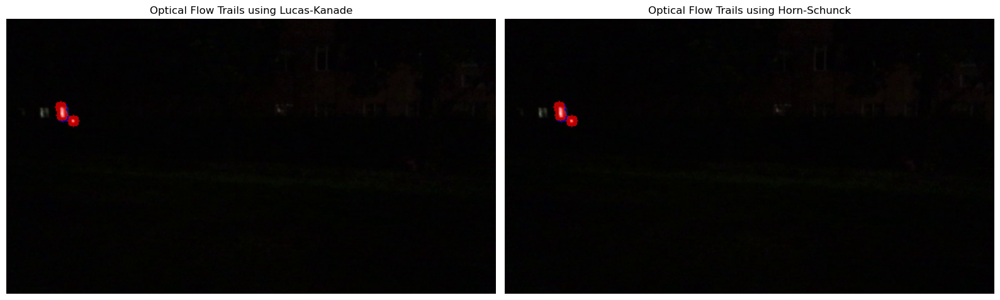

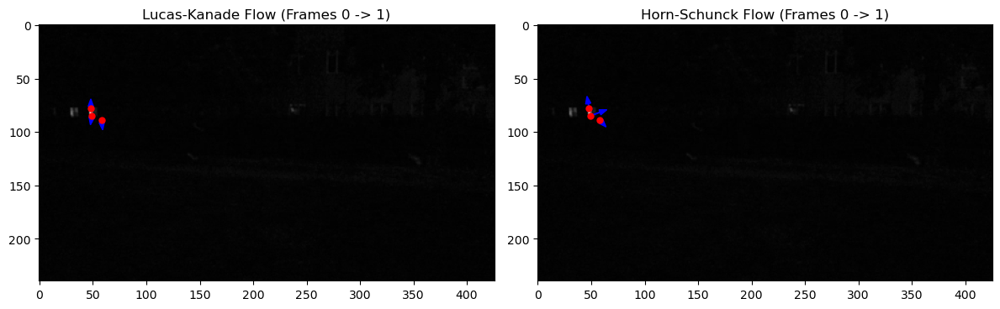

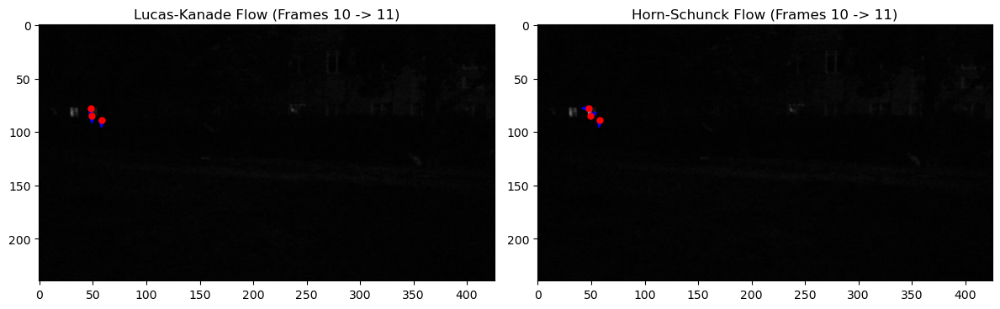

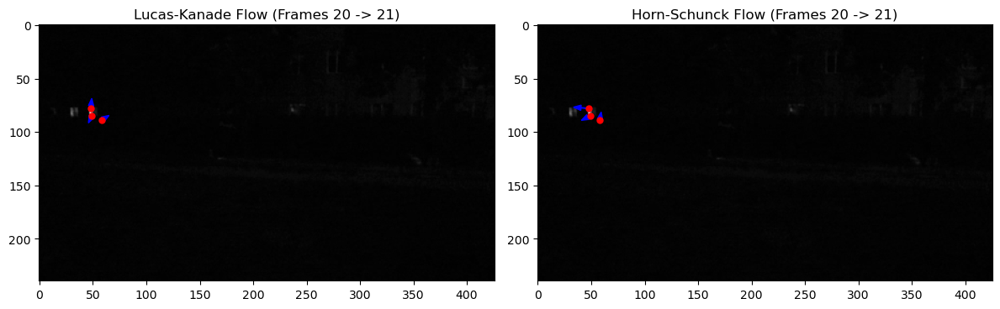

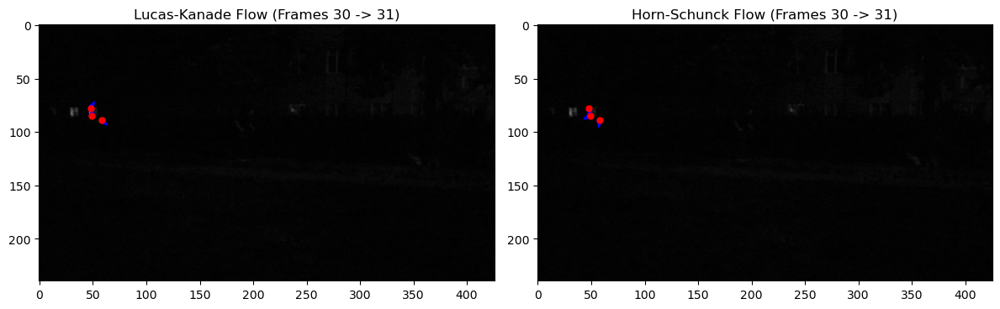

...

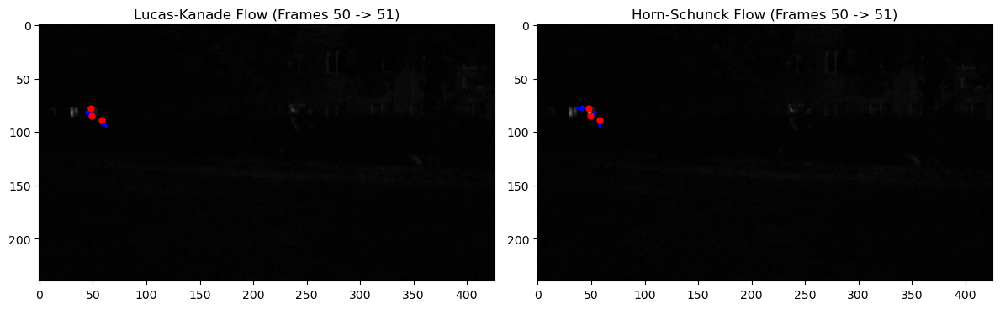

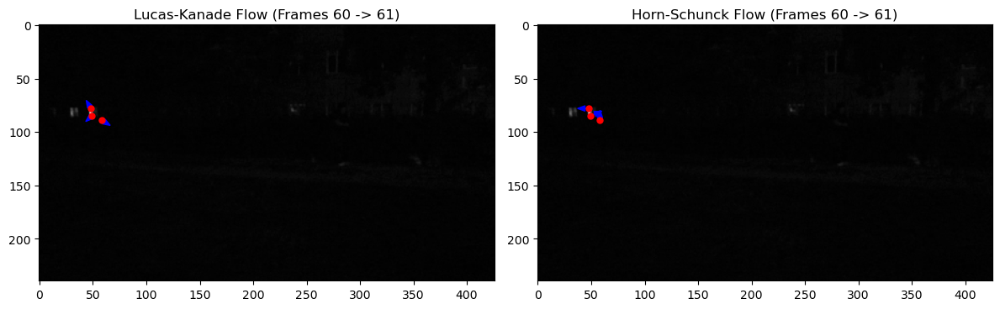

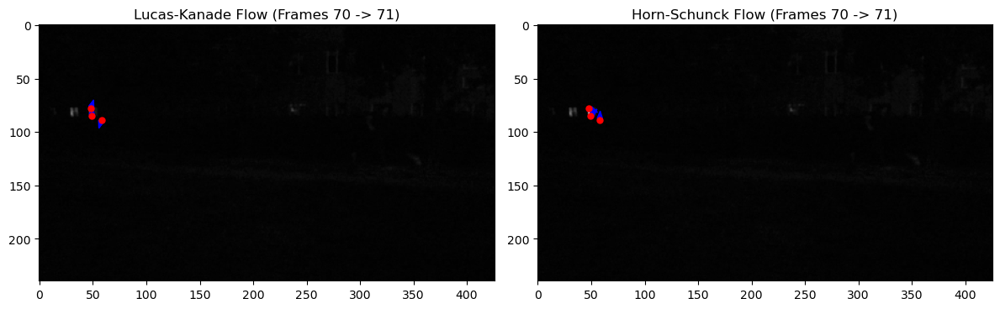

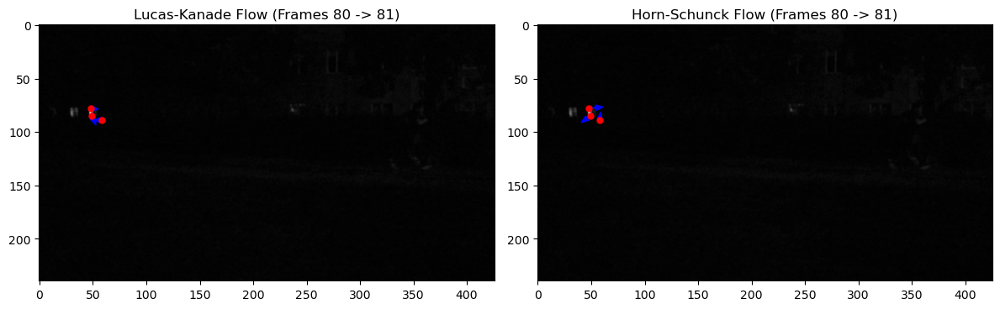

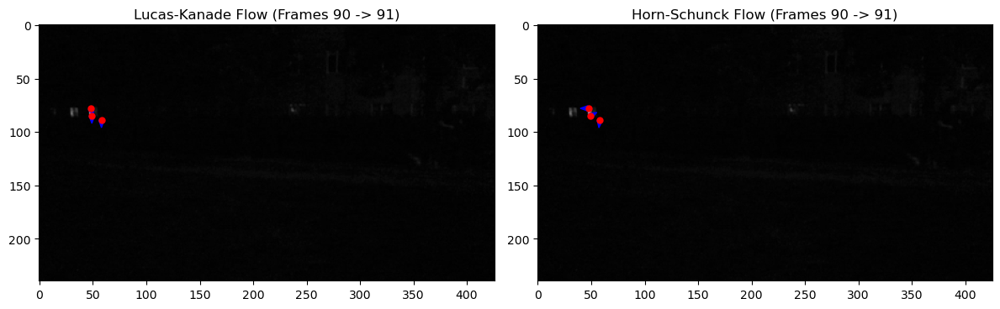

Processing the enhanced RUN video...
Video saved to Run_enhanced_clahe.mp4


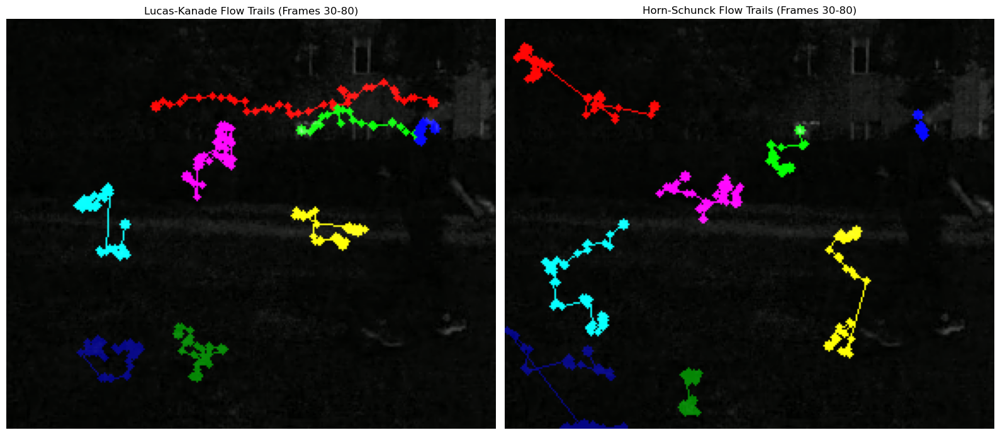

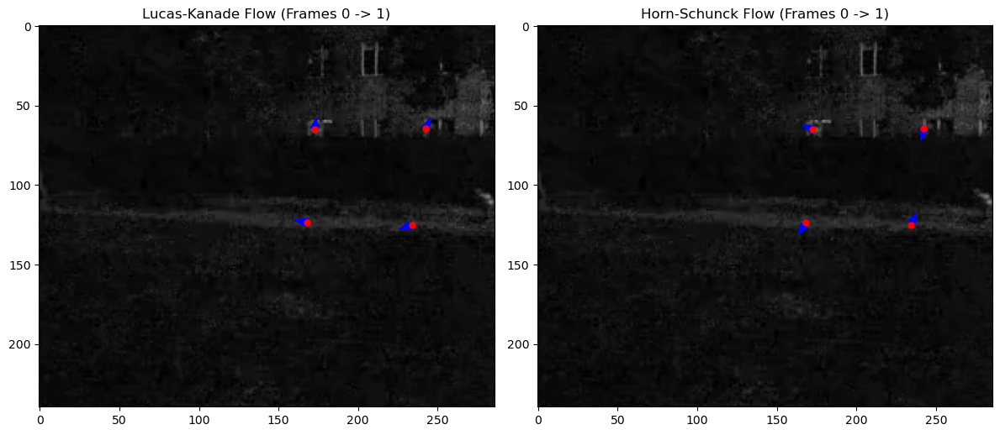

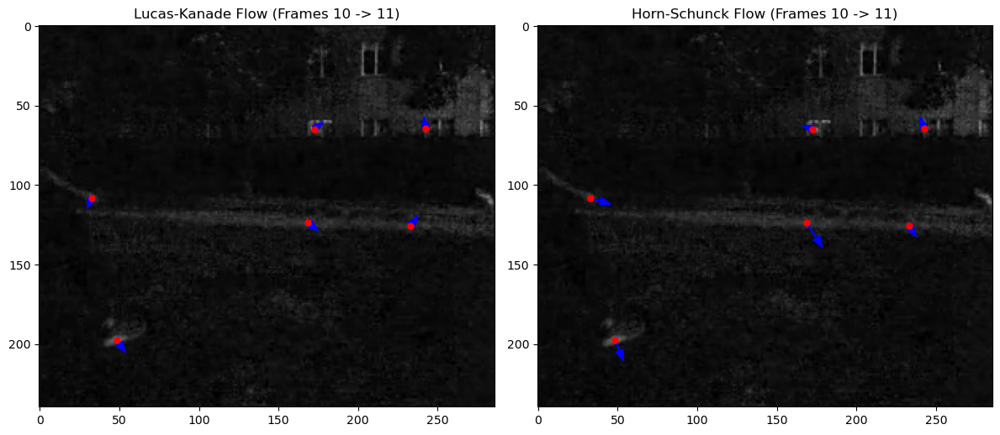

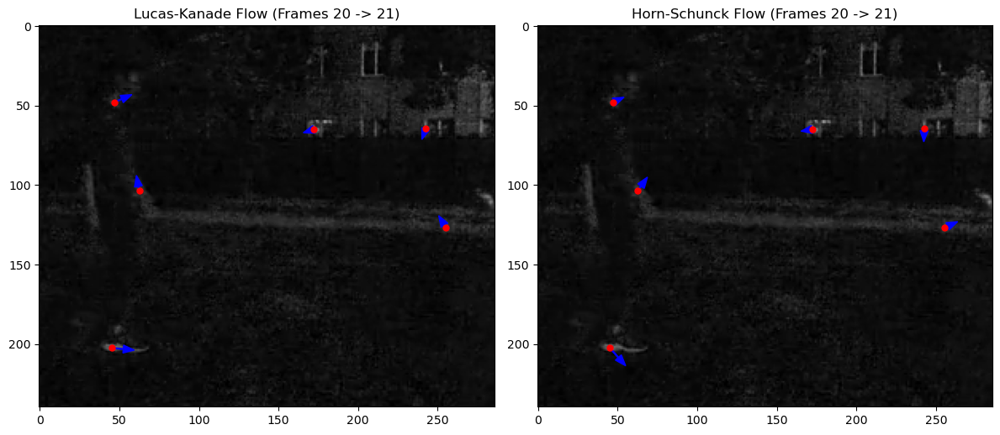

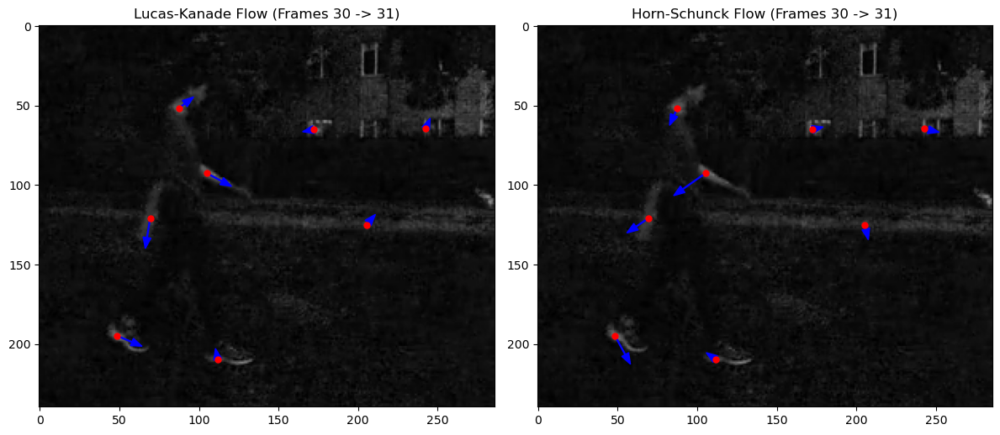

...

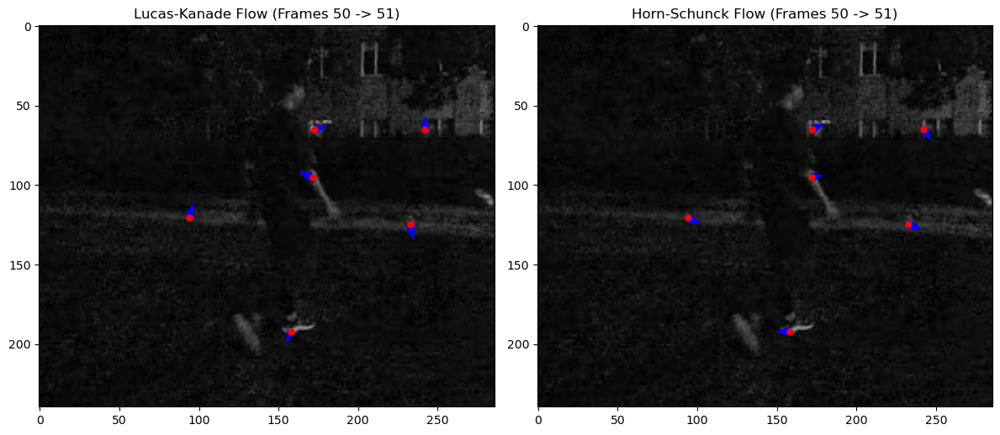

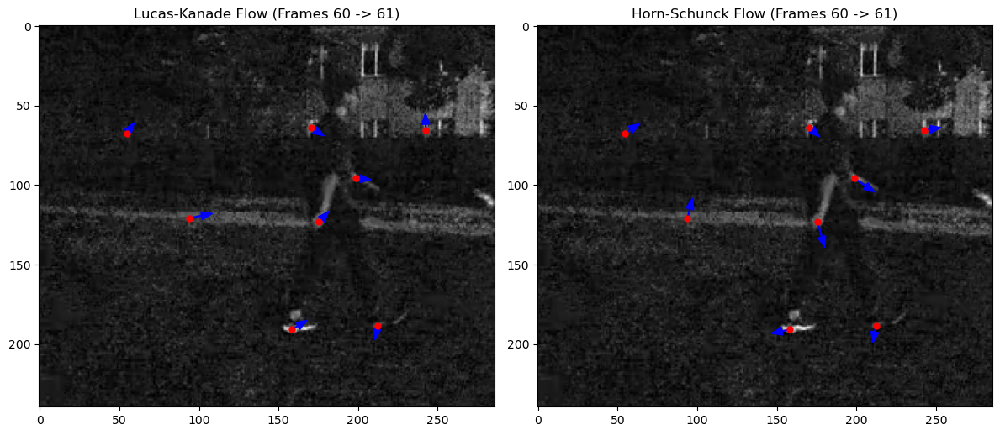

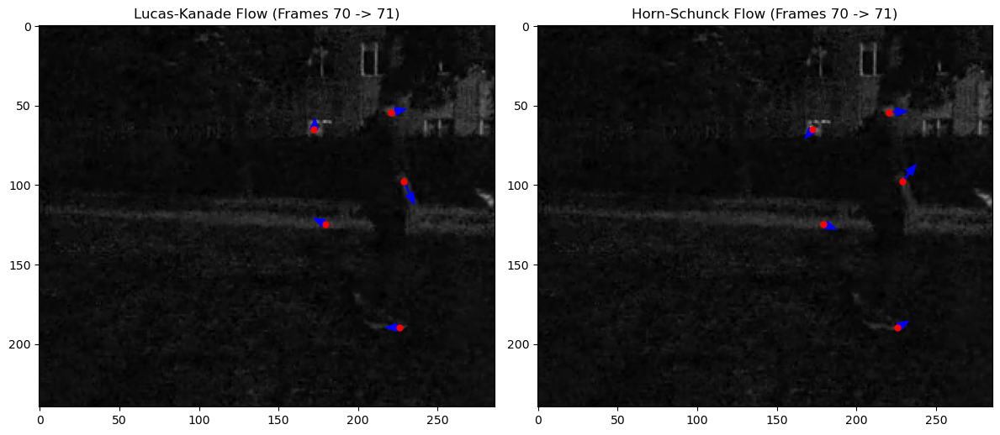

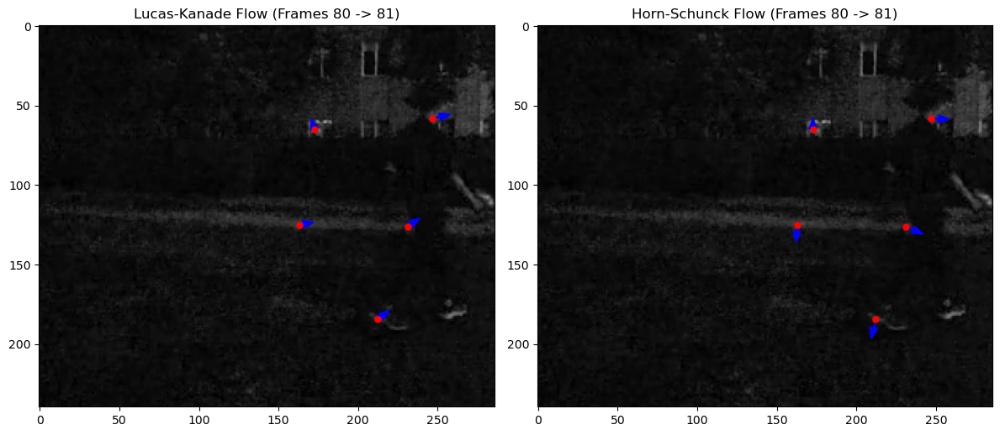

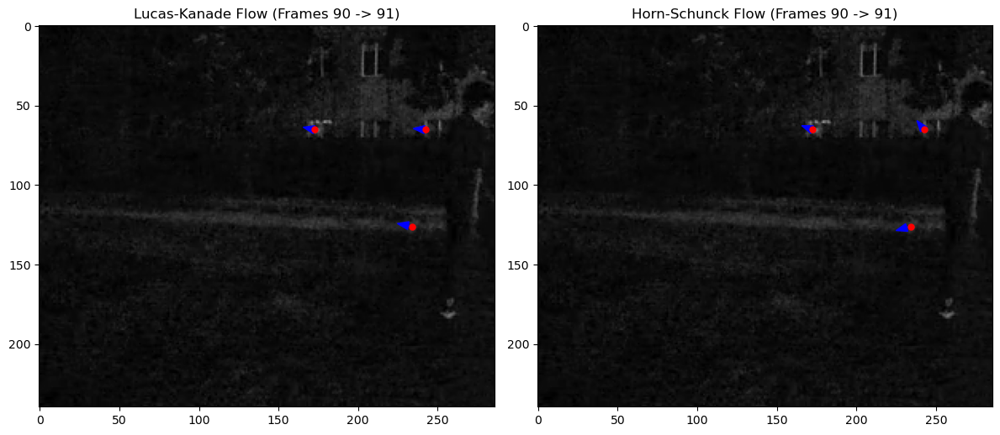

In [4]:
#############################################################################
##                                                                         ##
##           TODO: CODE BLOCK FOR STEP 4 IS HERE                           ##
#############################################################################
#Process the original video
print("Processing the original RUN video...")
plot_optical_flow_trails('Run.mp4', max_keypoints=10, window_size=5)
process_video('Run.mp4', frame_step=10, max_keypoints=10, window_size=5, total_pairs=10, scale = 3000)

#Process the enhanced video
print("Processing the enhanced RUN video...")
enhanced_video_path = enhance_video_clahe('Run.mp4', 'Run_enhanced_clahe.mp4')


new_plot_optical_flow_trails('Walk_enhanced_clahe.mp4', max_keypoints=10, window_size=5)

process_video_akaze('Walk_enhanced_clahe.mp4', frame_step=10, max_keypoints=10, window_size=5, total_pairs=10, scale = 100)


[**Fill in your discussion to Step 4 here**]

- Similar to the results in Step 1, we cannot observe meaningful optical flow trails and vectors from the original Run video, almost all the keypoints are not on the person. 

- After enhanced the Run video, **we can observe some optical flow trails that can represent the person's motion.** The optical flow trails of LK algorithm can better represent the motion than the one of HS algorithm. 

- In both **Enhanced Walk and Enhanced Run videos**, both LK and HS algorithms can track the motion well. Under same scale(3000), it can be ovserved that the optical flow vectors obtained from enhanced Run video are longer than the one from enhanced Walk video. This indicates that the motion in the Run video is faster and more obvious than Walk video.

- For same frame, LK algorithm and HS algorithm get different optical flow vectors. It can be observed that the vectors of LK algorithm can better represent the specific motion of the sepcific body parts, while the vectors of HS algorithm are more smooth and general that can represent the overall motion of the person. This is mainly because that HS is a more global method.

- The **directions** of optical flow vectors of Run and Walk videos are quite similar, indicating that the two motions have same body motion pattern but different speed.

Running continuous optical flow tracking:


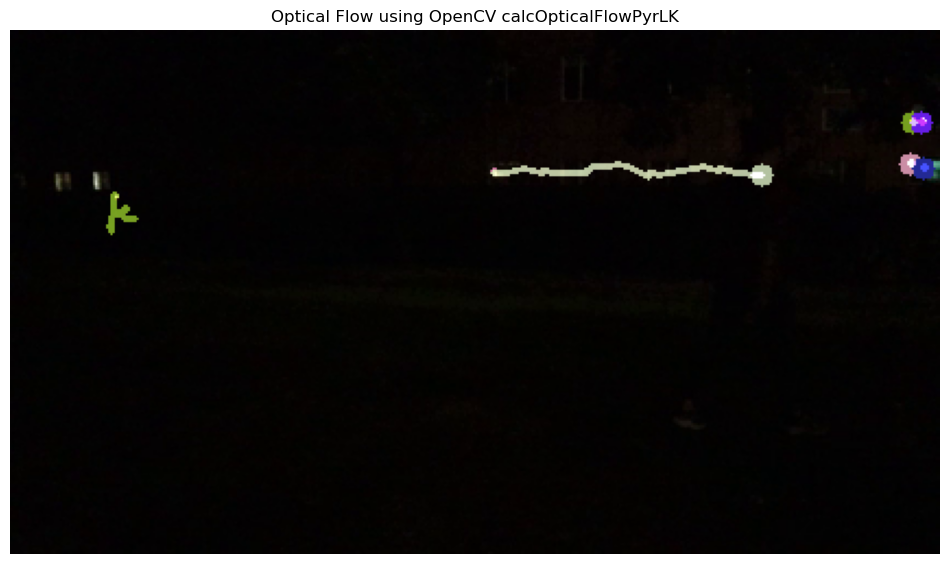


Running frame-by-frame optical flow estimation:


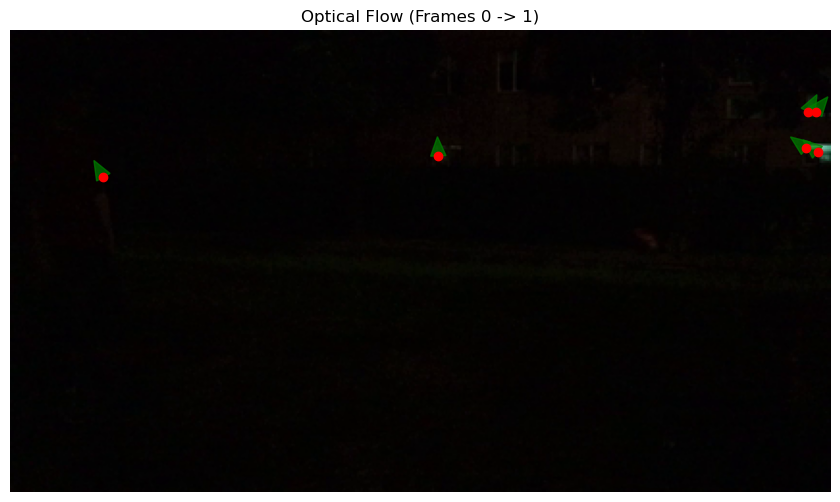

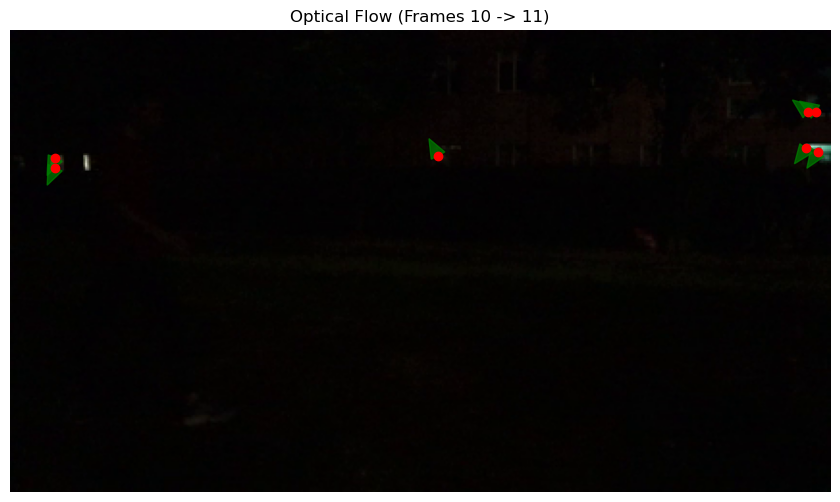

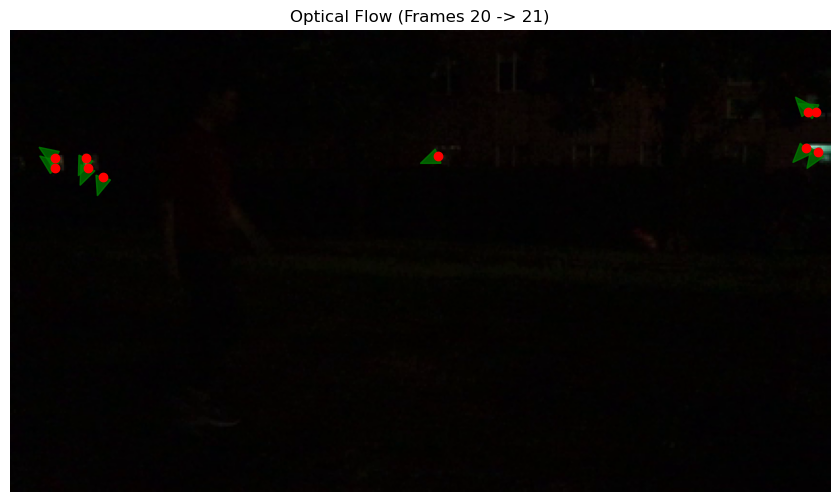

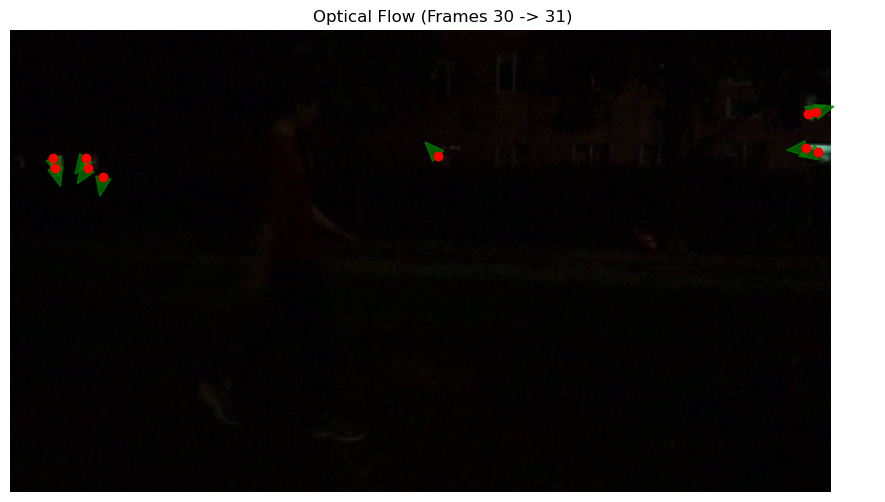

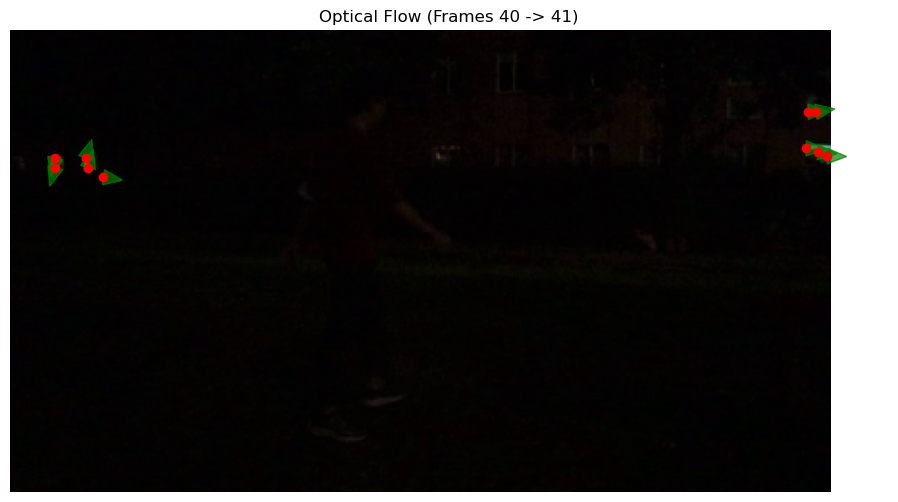

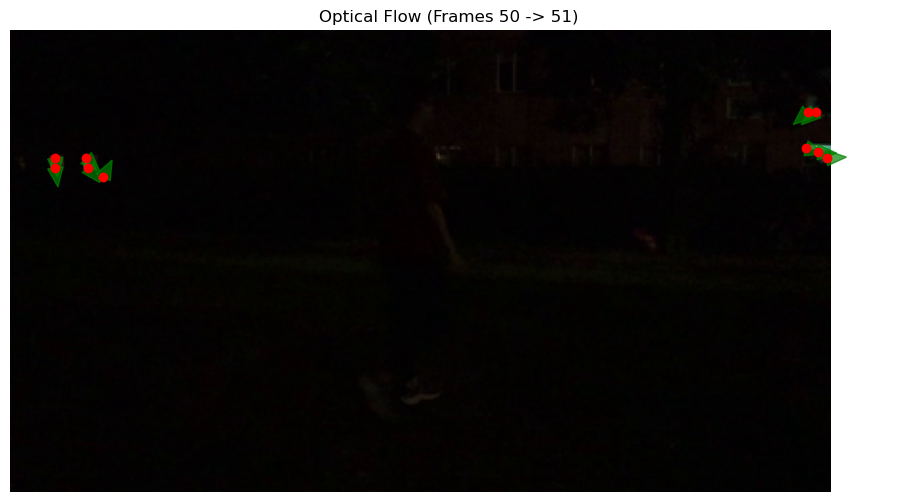

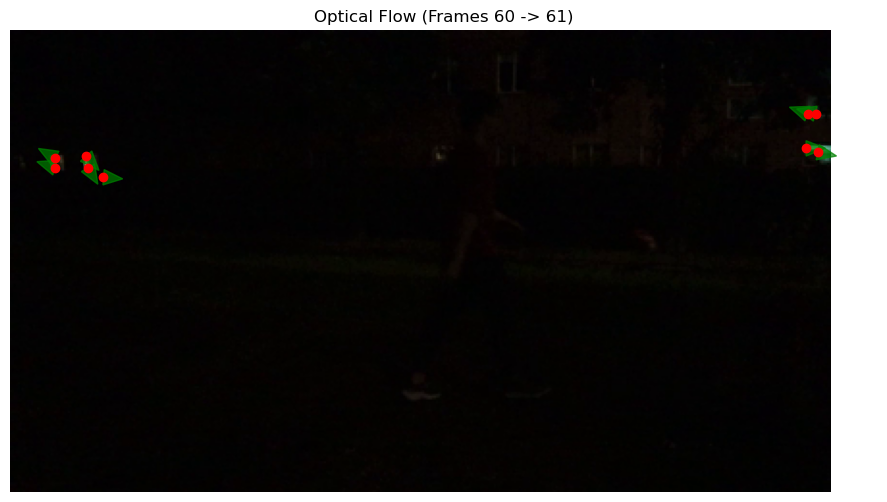

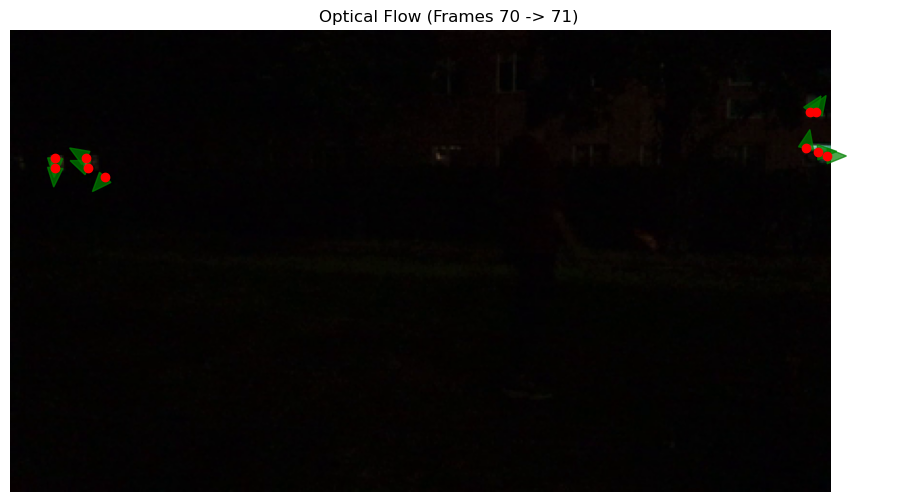

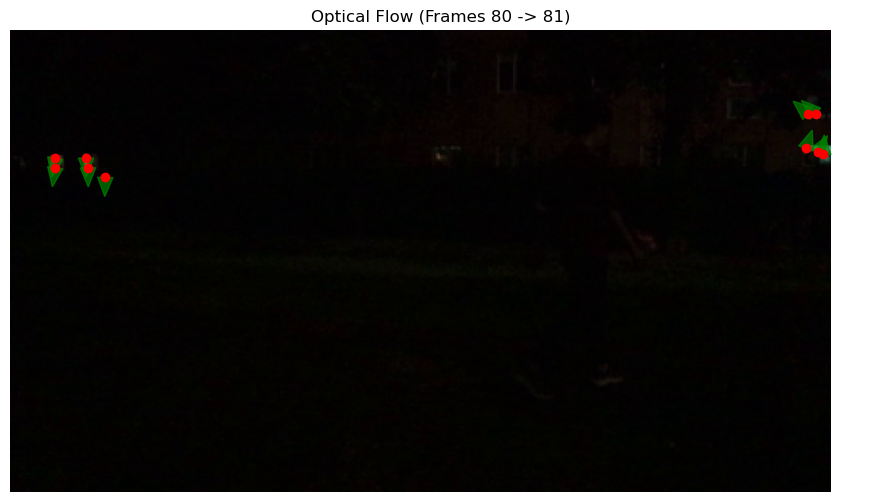

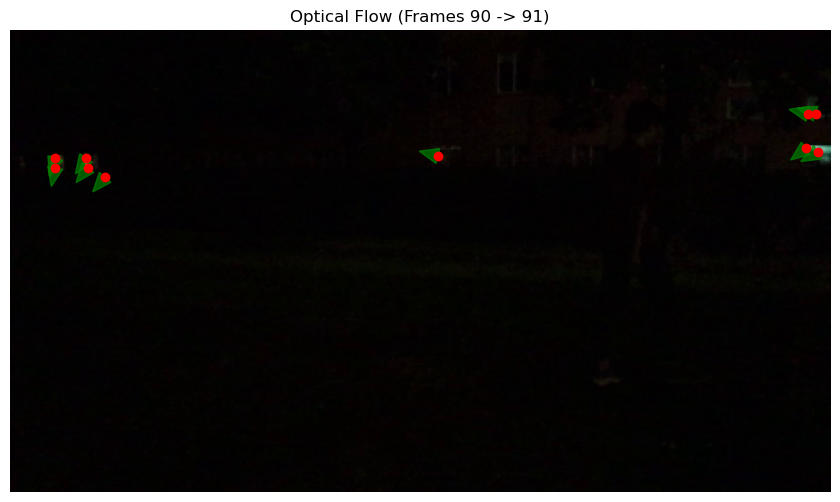

In [5]:
#############################################################################
##                                                                         ##
##           TODO: CODE BLOCK FOR STEP 5 IS HERE                           ##
#############################################################################
def estimate_optical_flow_opencv(video_path):
    cap = cv2.VideoCapture(video_path)
    
    # Parameters for corner detection
    feature_params = dict(
        maxCorners = 10,
        qualityLevel = 0.1,
        minDistance = 3,
        blockSize = 5
    )
    
    # Parameters for Lucas-Kanade optical flow
    lk_params = dict(
        winSize = (15, 15),
        maxLevel = 2,
        criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03)
    )
    
    colors = np.random.randint(0, 255, (100, 3))
    ret, old_frame = cap.read()
    if not ret:
        print("Failed to read video")
        return
    
    old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
    p0 = cv2.goodFeaturesToTrack(old_gray, mask=None, **feature_params)
    mask = np.zeros_like(old_frame)
    
    frame_count = 0
    final_frame = None
    
    while True:
        ret, frame = cap.read()
        if not ret:
            break
            
        frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)
        
        if p1 is not None:
            good_new = p1[st==1]
            good_old = p0[st==1]
            
            for i, (new, old) in enumerate(zip(good_new, good_old)):
                a, b = new.ravel()
                c, d = old.ravel()
                mask = cv2.line(mask, (int(a), int(b)), (int(c), int(d)), 
                             colors[i].tolist(), 2)
                frame = cv2.circle(frame, (int(a), int(b)), 5, colors[i].tolist(), -1)
        
        final_frame = cv2.add(frame, mask)
        frame_count += 1
        old_gray = frame_gray.copy()
        p0 = good_new.reshape(-1, 1, 2)
    
    cap.release()
    
    # Convert BGR to RGB for matplotlib
    final_frame_rgb = cv2.cvtColor(final_frame, cv2.COLOR_BGR2RGB)
    
    # Display the final result
    plt.figure(figsize=(12, 8))
    plt.imshow(final_frame_rgb)
    plt.title('Optical Flow using OpenCV calcOpticalFlowPyrLK')
    plt.axis('off')
    plt.show()



def process_video_opencv(video_path, frame_step=10):
    """
    Use OpenCV's built-in optical flow function to estimate the optical flow vectors of the video.
    Process adjacent frames every frame_step frames.
    """
    cap = cv2.VideoCapture(video_path)
    
    # Parameters for corner detection
    feature_params = dict(
        maxCorners = 10,
        qualityLevel = 0.1,
        minDistance = 3,
        blockSize = 5
    )
    
    # Parameters for Lucas-Kanade optical flow
    lk_params = dict(
        winSize = (15, 15),
        maxLevel = 2,
        criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03)
    )
    
    frame_idx = 0
    pair_count = 0
    
    while True:
        # Read first frame
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
        ret, old_frame = cap.read()
        if not ret:
            break
            
        old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
        p0 = cv2.goodFeaturesToTrack(old_gray, mask=None, **feature_params)
        
        if p0 is None:
            frame_idx += frame_step
            continue
            
        # Read next frame
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx + 1)
        ret, frame = cap.read()
        if not ret:
            break
            
        frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        
        # Calculate optical flow
        p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)
        
        if p1 is not None:
            # Display the results
            plt.figure(figsize=(12, 6))
            plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
            
            good_new = p1[st==1]
            good_old = p0[st==1]
            
            for i, (new, old) in enumerate(zip(good_new, good_old)):
                a, b = new.ravel()
                c, d = old.ravel()
                
                plt.plot(c, d, 'ro')
                
                scale_factor = 2.0
                plt.arrow(c, d,                           
                         (a-c) * scale_factor,           
                         (b-d) * scale_factor,           
                         color='g',                      
                         width=1.0,                      
                         head_width=8,                   
                         head_length=10,                 
                         length_includes_head=False,      
                         alpha=0.7)                      
            
            plt.title(f'Optical Flow (Frames {frame_idx} -> {frame_idx+1})')
            plt.axis('off')
            plt.show()
        
        frame_idx += frame_step
        pair_count += 1
        
        if pair_count >= 10:  # Process 10 pairs of frames
            break
    
    cap.release()
# Run two functions
video_path = 'Walk.mp4'
print("Running continuous optical flow tracking:")
estimate_optical_flow_opencv(video_path)
print("\nRunning frame-by-frame optical flow estimation:")
process_video_opencv(video_path, frame_step=10)


[**Fill in your discussion to Step 5 here**]

It can be observed that the optical flow (trails) obtained by OpenCV's cv2.calcOpticalFlowPyrLK is more accurate and smooth that can better represent the person's motion than my own implementation in Step 1 and in enhanced video. For the plottted per frame optical flow (vectors), it can be observed that the keypoints are still around the windows rather than the person's body, which is similar to the results in Step 1.

**Possible reasons for the discrepancies:**

**1. Why OpenCV's optical flow (trails) are more accurate and smooth:**

**a) Algorithm Implementation Level:**
- Although we implemented our own LK algorithm with pyramids, OpenCV has some other built-in more robust outlier detection and handling mechanisms.
- OpenCV has optimized parameter settings and numerical calculation methods.
- OpenCV implements more sophisticated sub-pixel accuracy tracking.

**b) Tracking Mechanism Level:**
- OpenCV maintains better feature point correspondence between consecutive frames.
- OpenCV may has more robust feature point re-detection mechanisms, able to replenish new feature points when points are lost.
- Implements better motion prediction mechanisms, helping maintain tracking during rapid motion.

**1. Why per-frame optical flow (vectors') keypoints still concentrate around windows:**

- goodFeaturesToTrack() algorithm tends to select corner points in high-contrast areas.
- Under low-light conditions, window areas have the most obvious gradient changes.
- The person regions, due to insufficient lighting, it's difficult to detect strong corner features.

